In [ ]:
%pip install scikit-learn==1.6.1 matplotlib seaborn pandas

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 25.0.1
[notice] To update, run: C:\Users\Marco\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

## Exploratory data analysis

As usual, we start by taking at look at the dataset.

* IDS_mapping.csv file isn't structured as a normal CSV because it contains multiple tables within one file

In [ ]:
# Load the data
ids_mapping = pd.read_csv("./data/IDS_mapping.csv", quotechar='"')
pd.set_option('display.max_rows', None)  # Display all rows
ids_mapping

,admission_type_id,description
0,1,Emergency
1,2,Urgent
2,3,Elective
3,4,Newborn
4,5,Not Available
5,6,NaN
6,7,Trauma Center
7,8,Not Mapped
8,NaN,NaN
9,discharge_disposition_id,description


🔍 Solution: Read and Split the File Correctly
Since Pandas can’t read it directly, we need to:

1. Read the file as raw text.
2. Split it into separate dataframes based on blank lines.
3. Process and clean each dataframe.

In [ ]:
# Read the raw file
with open("./data/IDS_mapping.csv", "r") as f:
    lines = f.read().split("\n")  # Split by line

📌 Identify the Different Tables in "IDS_mapping.csv"

Each section has:

* A header (column names) followed by data.
* A comma line separating different tables.

We need to extract:

1. admission_type_id mapping
2. discharge_disposition_id mapping
3. admission_source_id mapping

In [ ]:
# Find table starting points
tables = []
current_table = []

for line in lines:
    if line != ',':  # If line is NOT a comma
        current_table.append(line)
    else:  # If empty line, save previous table and start new
        if current_table:
            tables.append(current_table)
            current_table = []

# Add last table if exists
if current_table:
    tables.append(current_table)

# Check how many tables were found
print(f"Found {len(tables)} tables")
admission_type_id = tables[0]
discharge_disposition_id = tables[1]
admission_source_id = tables[2]

print(admission_type_id)
print(discharge_disposition_id)
print(admission_source_id)


Found 3 tables
['admission_type_id,description', '1,Emergency', '2,Urgent', '3,Elective', '4,Newborn', '5,Not Available', '6,NULL', '7,Trauma Center', '8,Not Mapped']
['discharge_disposition_id,description', '1,Discharged to home', '2,Discharged/transferred to another short term hospital', '3,Discharged/transferred to SNF', '4,Discharged/transferred to ICF', '5,Discharged/transferred to another type of inpatient care institution', '6,Discharged/transferred to home with home health service', '7,Left AMA', '8,Discharged/transferred to home under care of Home IV provider', '9,Admitted as an inpatient to this hospital', '10,Neonate discharged to another hospital for neonatal aftercare', '11,Expired', '12,Still patient or expected to return for outpatient services', '13,Hospice / home', '14,Hospice / medical facility', '15,Discharged/transferred within this institution to Medicare approved swing bed', '16,Discharged/transferred/referred another institution for outpatient services', '17,Disc

#### admission_type_id table extraction

In [ ]:
import csv

# Split the list into rows (each entry in the list represents a row in the CSV)
rows = [row.split(',') for row in admission_type_id]

# Define the output CSV file name
output_file_admission_type_id = './output_data/admission_type_id.csv'

# Write to CSV
with open(output_file_admission_type_id, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(rows)

print(f"CSV file '{output_file_admission_type_id}' created successfully.")

CSV file './output_data/admission_type_id.csv' created successfully.


In [ ]:
# Load the data admission_type_id
admission_type_id = pd.read_csv("./output_data/admission_type_id.csv")
pd.set_option('display.max_rows', None)  # Display all rows
admission_type_id

,admission_type_id,description
0,1,Emergency
1,2,Urgent
2,3,Elective
3,4,Newborn
4,5,Not Available
5,6,NaN
6,7,Trauma Center
7,8,Not Mapped


In [ ]:
# Load dataset
diabetic_data_placeholders_substituted_placeholders_substituted = pd.read_csv("./data/diabetic_data.csv")

pd.set_option('display.max_columns', None)  # Display all cols

# Display first few rows
display(diabetic_data.head())

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,?,?,1,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,59,0,18,0,0,0,276,250.01,255,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,11,5,13,2,0,1,648,250,V27,6,NaN,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,?,44,1,16,0,0,0,8,250.43,403,7,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,?,51,0,8,0,0,0,197,157,250,5,NaN,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


#### discharge_disposition_id table extraction

In [ ]:
import csv

# Split the list into rows (each entry in the list represents a row in the CSV)
rows = [row.split(',') for row in discharge_disposition_id]

# Define the output CSV file name
output_file_discharge_disposition_id = './output_data/discharge_disposition_id.csv'

# Write to CSV
with open(output_file_discharge_disposition_id, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(rows)

print(f"CSV file '{output_file_discharge_disposition_id}' created successfully.")

CSV file './output_data/discharge_disposition_id.csv' created successfully.


In [ ]:
# Load the data discharge_disposition_id
discharge_disposition_id = pd.read_csv("./output_data/discharge_disposition_id.csv", quotechar='"')
pd.set_option('display.max_rows', None)  # Display all rows
discharge_disposition_id

,discharge_disposition_id,description
0,1,Discharged to home
1,2,Discharged/transferred to another short term h...
2,3,Discharged/transferred to SNF
3,4,Discharged/transferred to ICF
4,5,Discharged/transferred to another type of inpa...
5,6,Discharged/transferred to home with home healt...
6,7,Left AMA
7,8,Discharged/transferred to home under care of H...
8,9,Admitted as an inpatient to this hospital
9,10,Neonate discharged to another hospital for neo...


#### admission_source_id table extraction

In [ ]:
import csv

# Split the list into rows (each entry in the list represents a row in the CSV)
rows = [row.split(',') for row in admission_source_id]

# Define the output CSV file name
output_file_admission_source_id = './output_data/admission_source_id.csv'

# Write to CSV
with open(output_file_admission_source_id, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(rows)

print(f"CSV file '{output_file_admission_source_id}' created successfully.")

CSV file './output_data/admission_source_id.csv' created successfully.


In [ ]:
# Load the data admission_source_id
admission_source_id = pd.read_csv("./output_data/admission_source_id.csv", quotechar='"')
pd.set_option('display.max_rows', None)  # Display all rows
admission_source_id

,admission_source_id,description
0,1.0,Physician Referral
1,2.0,Clinic Referral
2,3.0,HMO Referral
3,4.0,Transfer from a hospital
4,5.0,Transfer from a Skilled Nursing Facility (SNF)
5,6.0,Transfer from another health care facility
6,7.0,Emergency Room
7,8.0,Court/Law Enforcement
8,9.0,Not Available
9,10.0,Transfer from critial access hospital


### Task 1: Dataset description (15%)
1.1 Describe the characteristics of the dataset (e.g. data types, sample-to-features ratio) and
use descriptive statistics and figures/plots to show the dataset characteristics.

1.2 Describe the challenges with the dataset (e.g. missing data, unbalanced classes). (5%)

---

1.1 and 1.2 Identify Data Characteristics, and describe the challenges within the dataset:
* a. Data Types: Determine whether the features in your dataset are numerical (e.g., integers, floats) or categorical (e.g., strings, boolean values).
* b. Sample-to-Feature Ratio: This refers to the number of samples (rows) in the dataset relative to the number of features (columns). A common ratio is to have more samples than features, but some datasets might have more features than samples.
* c. Missing Values: Check if there are missing values in any of the features and how they are handled.
* d. Outliers: Look for any outliers or unusual values in the dataset that might affect analysis.

In [ ]:
diabetic_data = pd.read_csv("./data/diabetic_data.csv")

In [ ]:
# Replace missing values with NaN

# Define a list of common placeholders
placeholders = ['?', 'NA', 'none', 'N/A', 'null']

diabetic_data_placeholders_substituted = diabetic_data.copy(deep=True)

# Replace all placeholder values with NaN across the entire DataFrame
diabetic_data_placeholders_substituted.replace(placeholders, None, inplace=True)

In [ ]:
analyze_dataframe(diabetic_data_placeholders_substituted)

DataFrame - Data Types of Features:
encounter_id                 int64
patient_nbr                  int64
race                        object
gender                      object
age                         object
weight                      object
admission_type_id            int64
discharge_disposition_id     int64
admission_source_id          int64
time_in_hospital             int64
payer_code                  object
medical_specialty           object
num_lab_procedures           int64
num_procedures               int64
num_medications              int64
number_outpatient            int64
number_emergency             int64
number_inpatient             int64
diag_1                      object
diag_2                      object
diag_3                      object
number_diagnoses             int64
max_glu_serum               object
A1Cresult                   object
metformin                   object
repaglinide                 object
nateglinide                 object
chlorpropamide     

C:\Users\Marco\AppData\Local\Temp\ipykernel_1580\1076541090.py:50: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df[col] = pd.to_datetime(df[col], errors='raise')  # Will raise an error if not convertible
C:\Users\Marco\AppData\Local\Temp\ipykernel_1580\1076541090.py:50: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df[col] = pd.to_datetime(df[col], errors='raise')  # Will raise an error if not convertible
C:\Users\Marco\AppData\Local\Temp\ipykernel_1580\1076541090.py:50: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df[col] = pd.to_datetime(df[col], errors='raise')  # Will


Corrected Data Types:
encounter_id                 int64
patient_nbr                  int64
race                        object
gender                      object
age                         object
weight                      object
admission_type_id            int64
discharge_disposition_id     int64
admission_source_id          int64
time_in_hospital             int64
payer_code                  object
medical_specialty           object
num_lab_procedures           int64
num_procedures               int64
num_medications              int64
number_outpatient            int64
number_emergency             int64
number_inpatient             int64
diag_1                      object
diag_2                      object
diag_3                      object
number_diagnoses             int64
max_glu_serum               object
A1Cresult                   object
metformin                   object
repaglinide                 object
nateglinide                 object
chlorpropamide              obje

C:\Users\Marco\AppData\Local\Temp\ipykernel_1580\1076541090.py:50: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df[col] = pd.to_datetime(df[col], errors='raise')  # Will raise an error if not convertible
C:\Users\Marco\AppData\Local\Temp\ipykernel_1580\1076541090.py:50: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df[col] = pd.to_datetime(df[col], errors='raise')  # Will raise an error if not convertible
C:\Users\Marco\AppData\Local\Temp\ipykernel_1580\1076541090.py:50: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df[col] = pd.to_datetime(df[col], errors='raise')  # Will

In [ ]:
print("Missing Values in Each Feature:")
missing_values = diabetic_data_placeholders_substituted.isnull().sum()
print(missing_values)
# Check for missing values

Missing Values in Each Feature:
encounter_id                    0
patient_nbr                     0
race                         2273
gender                          0
age                             0
weight                      98569
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                  40256
medical_specialty           49949
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         21
diag_2                        358
diag_3                       1423
number_diagnoses                0
max_glu_serum               96420
A1Cresult                   84748
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride     

In [ ]:
diabetic_data_placeholders_substituted.to_csv('./output_data/replaced_placeholders_with_nan.csv', sep=',', index=False, encoding='utf-8')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


def analyze_dataframe(df, df_name="DataFrame"):
    # Prepare the output text
    output_text = []

    # a. Identify Data Types for every CSV file
    print(f"{df_name} - Data Types of Features:")
    print(df.dtypes)
    print(f"{df_name} - Shape: " , df.shape)

    # b. Sample-to-Feature Ratio
    num_samples = df.shape[0]  # Number of rows (samples)
    num_features = df.shape[1]  # Number of columns (features)
    print(f"\n{df_name} - Sample-to-Feature Ratio:")
    print(f"Number of Samples: {num_samples}")
    print(f"Number of Features: {num_features}")
    print(f"Sample-to-Feature Ratio: {num_samples / num_features:.2f}")

    # c. Missing Values
    print(f"\n{df_name} - Missing Values in Each Feature:")
    missing_values = df.isnull().sum()
    print(missing_values)

    # c.1. Missing Values Percentage
    print(f"\n{df_name} - Missing Values Percentage:")
    missing_values_percentage = (missing_values / len(df)) * 100
    print(missing_values_percentage)

    # d. Summary Statistics
    print(f"\n{df_name} - Summary Statistics:")
    summary_statistics = df.describe(include='all')

    # d.1 Print Statistics in a more readable format
    print(f"\n{df_name} - Summary Statistics:")
    print(summary_statistics)

    # e. Check for coerence in data types
    print(f"\n{df_name} - Check for coherence in data types:")


    # Convert columns that look like dates (strings in date format) to datetime
    for col in df.select_dtypes(include='object').columns:
        try:
            # Try converting to datetime
            df[col] = pd.to_datetime(df[col], errors='raise')  # Will raise an error if not convertible
            print(f"Converted {col} to 'datetime'")
        except (ValueError, TypeError):
            pass

    # Check the final data types
    print("\nCorrected Data Types:")
    print(df.dtypes)



In [ ]:
# Analyze the diabetic_data.csv DataFrame
# analyze_dataframe(diabetic_data, "diabetic_data.csv DataFrame") - without replacing placeholders

In [ ]:
# Analyze the admission_source_id.csv DataFrame
analyze_dataframe(admission_source_id, "admission_source_id.csv DataFrame")

admission_source_id.csv DataFrame - Data Types of Features:
admission_source_id    float64
description             object
dtype: object
admission_source_id.csv DataFrame - Shape:  (26, 2)

admission_source_id.csv DataFrame - Sample-to-Feature Ratio:
Number of Samples: 26
Number of Features: 2
Sample-to-Feature Ratio: 13.00

admission_source_id.csv DataFrame - Missing Values in Each Feature:
admission_source_id    1
description            2
dtype: int64


In [ ]:
# Analyze the admission_type_id.csv DataFrame
analyze_dataframe(admission_type_id, "admission_type_id.csv DataFrame")

admission_type_id.csv DataFrame - Data Types of Features:
admission_type_id     int64
description          object
dtype: object
admission_type_id.csv DataFrame - Shape:  (8, 2)

admission_type_id.csv DataFrame - Sample-to-Feature Ratio:
Number of Samples: 8
Number of Features: 2
Sample-to-Feature Ratio: 4.00

admission_type_id.csv DataFrame - Missing Values in Each Feature:
admission_type_id    0
description          1
dtype: int64


In [ ]:
# Analyze the discharge_disposition_id.csv DataFrame
analyze_dataframe(discharge_disposition_id, "discharge_disposition_id.csv DataFrame")

discharge_disposition_id.csv DataFrame - Data Types of Features:
discharge_disposition_id     int64
description                 object
dtype: object
discharge_disposition_id.csv DataFrame - Shape:  (30, 2)

discharge_disposition_id.csv DataFrame - Sample-to-Feature Ratio:
Number of Samples: 30
Number of Features: 2
Sample-to-Feature Ratio: 15.00

discharge_disposition_id.csv DataFrame - Missing Values in Each Feature:
discharge_disposition_id    0
description                 1
dtype: int64


In [ ]:
# Load the diabetic_data_placeholders_with_nan.csv
diabetic_data_placeholders_substituted = pd.read_csv("./output_data/replaced_placeholders_with_nan.csv")

C:\Users\Marco\AppData\Local\Temp\ipykernel_9288\135843548.py:2: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  diabetic_data_placeholders_substituted = pd.read_csv("./output_data/replaced_placeholders_with_nan.csv")


In [ ]:
# Load the admission_source_id.csv
admission_source_id = pd.read_csv("./output_data/admission_source_id.csv")

# Load the admission_type_id.csv
admission_type_id = pd.read_csv("./output_data/admission_type_id.csv")

# Load the discharge_disposition_id.csv
discharge_disposition_id = pd.read_csv("./output_data/discharge_disposition_id.csv")

In [ ]:
# join the three dataframes into diabetic_data_placeholders_substituted dataframe

diabetic_data_placeholders_substituted = diabetic_data_placeholders_substituted.merge(admission_type_id, how="left", left_on="admission_type_id", right_on="admission_type_id")
diabetic_data_placeholders_substituted = diabetic_data_placeholders_substituted.merge(discharge_disposition_id, how="left", left_on="discharge_disposition_id", right_on="discharge_disposition_id")
diabetic_data_placeholders_substituted = diabetic_data_placeholders_substituted.merge(admission_source_id, how="left", left_on="admission_source_id", right_on="admission_source_id")

# Check the columns after each merge to ensure they are correct
print(diabetic_data_placeholders_substituted.columns)

# Rename the columns correctly
diabetic_data_placeholders_substituted.rename(columns={"description_x": "admission_type_id_description",
                     "description_y": "discharge_disposition_id_description",
                     "description": "admission_source_id_description"}, inplace=True)

# Verify the columns after renaming
print(diabetic_data_placeholders_substituted.columns)

print(diabetic_data_placeholders_substituted.head())

print(diabetic_data_placeholders_substituted[['admission_type_id', 'admission_type_id_description']].head())
print(diabetic_data_placeholders_substituted[['discharge_disposition_id', 'discharge_disposition_id_description']].head())
print(diabetic_data_placeholders_substituted[['admission_source_id', 'admission_source_id_description']].head())

Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'payer_code', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted',
       'description_x', 'description_y', 'description'],
      dtype='object')
Index(['encou

In [ ]:
# Save the merged DataFrame to a new CSV file
diabetic_data_placeholders_substituted.to_csv('./output_data/diabetic_data_placeholders_substituted_merged_ids_mapping.csv', sep=',', index=False, encoding='utf-8')

#### Visualise distributions

We can now plot some graphs showing the data distribution for all features in the dataset.
There are quite a few features in the dataset: we split them in different groups when plotting their distributions.

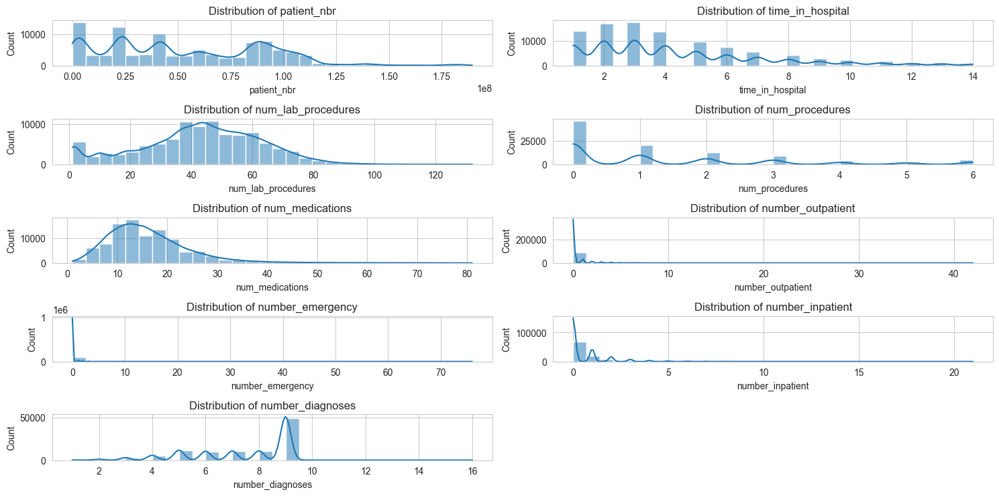

In [ ]:
# Selecting numerical columns
numerical_cols = diabetic_data_placeholders_substituted.select_dtypes(include=['int64', 'float64']).columns
num_cols = 2
num_rows = (len(numerical_cols) // num_cols) + (1 if len(numerical_cols) % num_cols > 0 else 0)

# Plot distributions for numerical columns
plt.figure(figsize=(15, 10))

# Drop columns with id in the name
numerical_cols_no_id_for_plots = [col for col in numerical_cols if "id" not in col]

for i, col in enumerate(numerical_cols_no_id_for_plots):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.histplot(diabetic_data_placeholders_substituted[col], kde=True, bins=30)
    plt.title(f"Distribution of {col}")

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Import the CSV file as a pandas DataFrame
file_path = './output_data/replaced_placeholders_with_nan.csv'
diabetic_data = pd.read_csv(file_path, sep=',', encoding='utf-8')

# Display the first few rows of the DataFrame to verify the import
print(diabetic_data.head())

C:\Users\Marco\AppData\Local\Temp\ipykernel_9288\427417082.py:5: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  diabetic_data = pd.read_csv(file_path, sep=',', encoding='utf-8')


   encounter_id  patient_nbr             race  gender      age weight  \
0       2278392      8222157        Caucasian  Female   [0-10)    NaN   
1        149190     55629189        Caucasian  Female  [10-20)    NaN   
2         64410     86047875  AfricanAmerican  Female  [20-30)    NaN   
3        500364     82442376        Caucasian    Male  [30-40)    NaN   
4         16680     42519267        Caucasian    Male  [40-50)    NaN   

   admission_type_id  discharge_disposition_id  admission_source_id  \
0                  6                        25                    1   
1                  1                         1                    7   
2                  1                         1                    7   
3                  1                         1                    7   
4                  1                         1                    7   

   time_in_hospital  ... citoglipton insulin  glyburide-metformin  \
0                 1  ...          No      No                   No

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import os
import shutil


output_dir = "plots"
os.makedirs(output_dir, exist_ok=True)
numerical_cols = diabetic_data_placeholders_substituted.select_dtypes(include=['int64', 'float64']).columns

diabetic_data_placeholders_substituted_merged_ids_mapping = diabetic_data_placeholders_substituted.drop(columns='readmitted', inplace=False)
non_numerical_cols = diabetic_data_placeholders_substituted_merged_ids_mapping.drop(columns=numerical_cols).columns

# Create a list to store plot filenames
plot_filenames = []

# Plot distributions for non-numerical columns and save them as images
for col in non_numerical_cols:
    distinct_count = diabetic_data_placeholders_substituted_merged_ids_mapping[col].nunique()

    plt.figure(figsize=(10, 5))

    if col == 'diag_3':
        plt.xticks([], [])

    if distinct_count > 10:
        plt.xticks([], [])

    plt.xticks(rotation=45, ha="right")
    sns.histplot(diabetic_data_placeholders_substituted_nolabel[col], kde=True, bins=30)
    plt.title(f"Distribution of {col}")


    plot_filename = f"{output_dir}/{col}_distribution.png"
    plt.tight_layout()
    plt.savefig(plot_filename)
    plt.close()


    plot_filenames.append(plot_filename)


zip_filename = "./output_data/plots_ids_mapping_description_added.zip"
with zipfile.ZipFile(zip_filename, 'w') as zipf:
    for plot_file in plot_filenames:
        zipf.write(plot_file, os.path.basename(plot_file))


shutil.rmtree(output_dir)

print(f"All plots have been saved and zipped into {zip_filename}")


All plots have been saved and zipped into ./output_data/plots_ids_mapping_description_added.zip


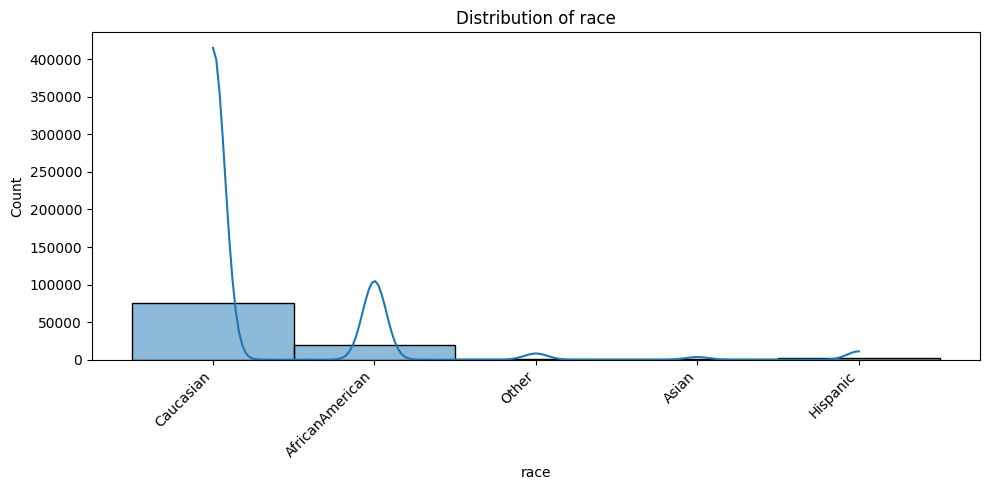

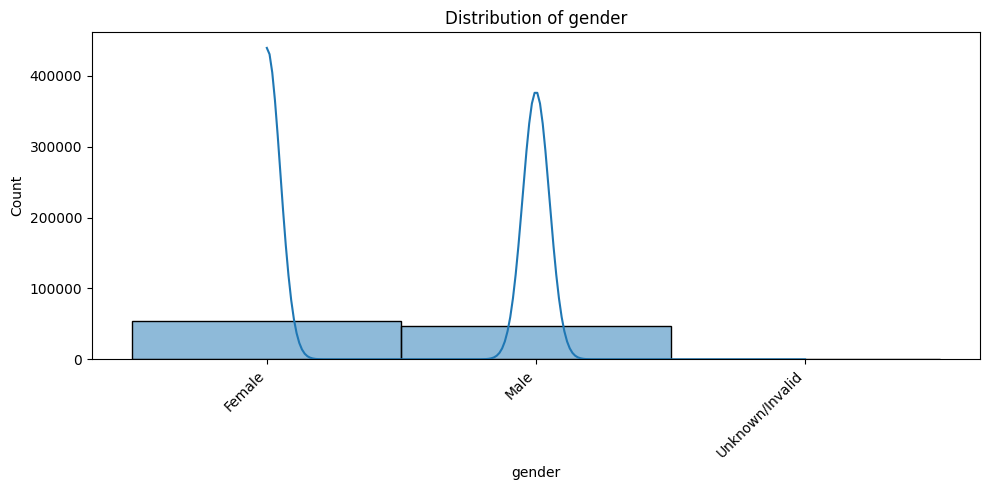

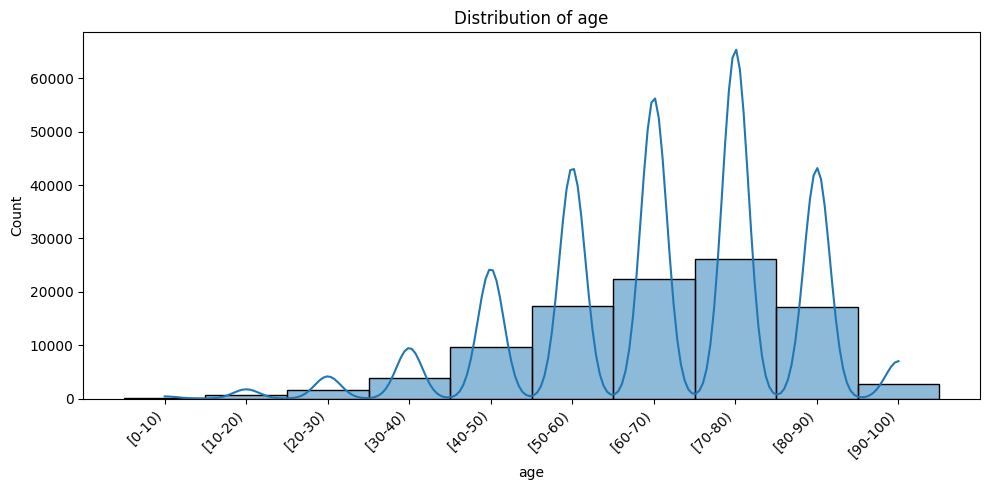

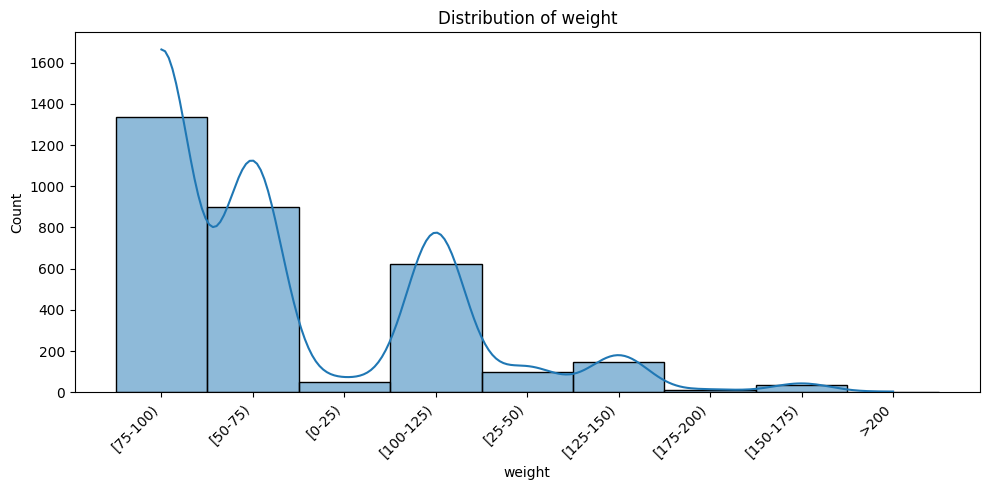

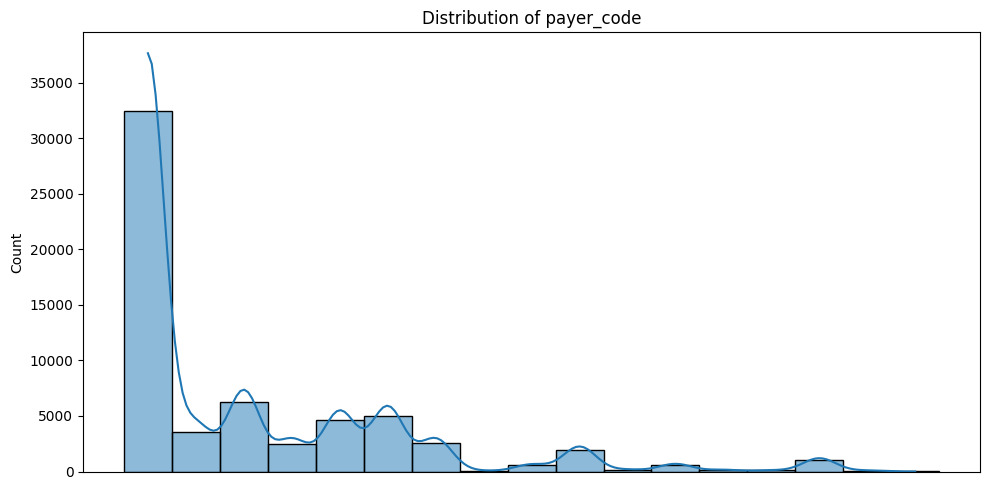

...

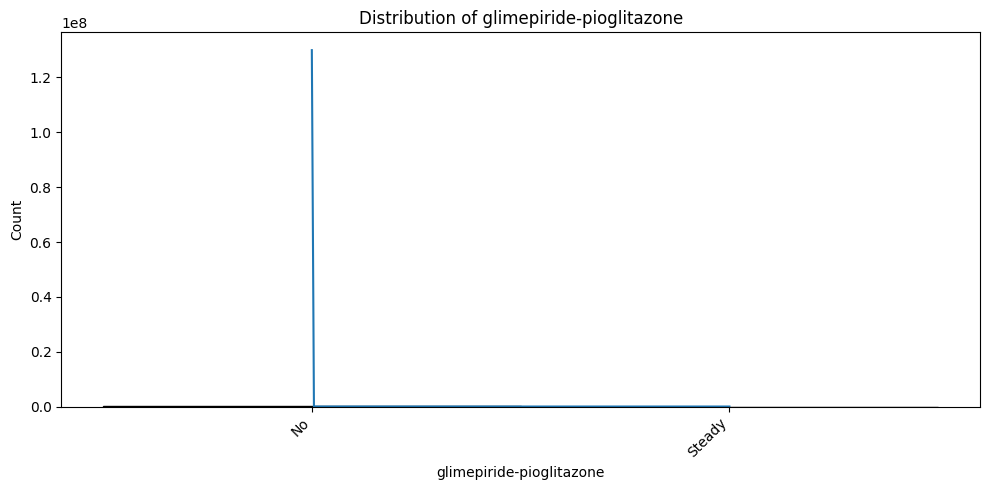

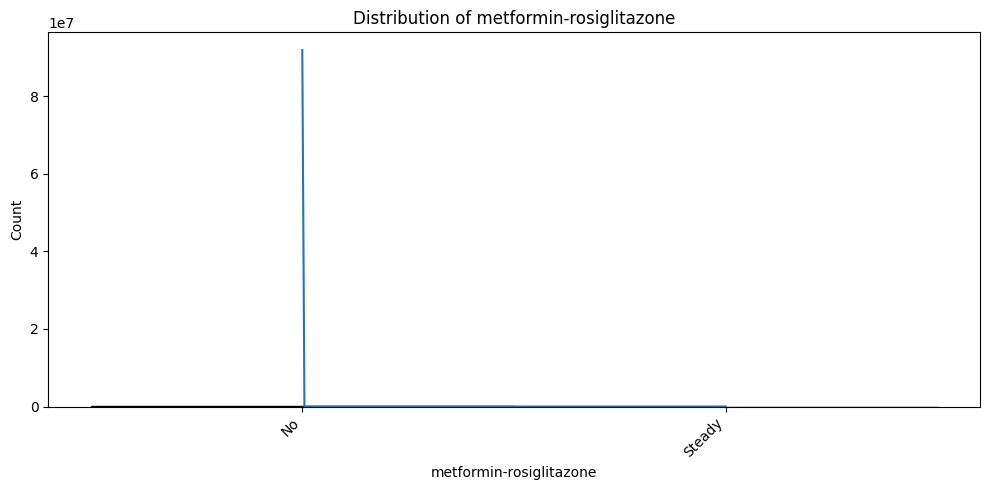

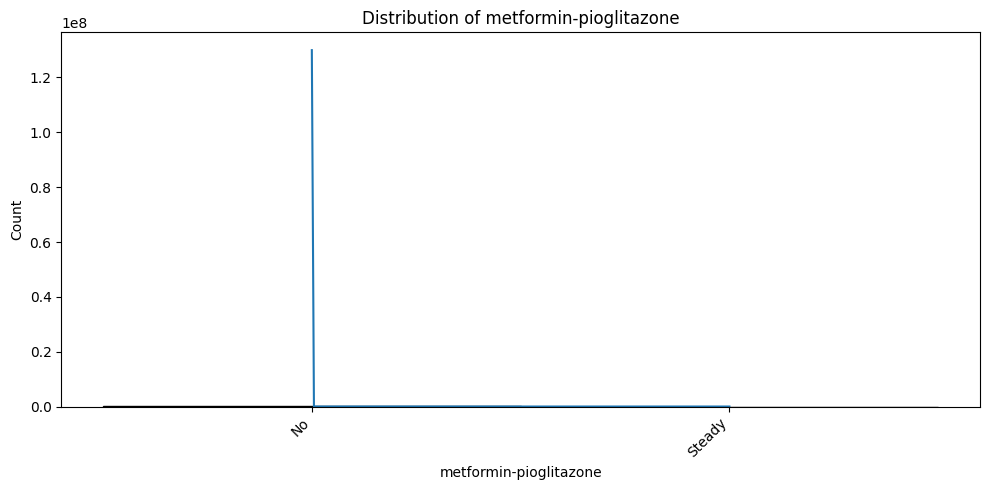

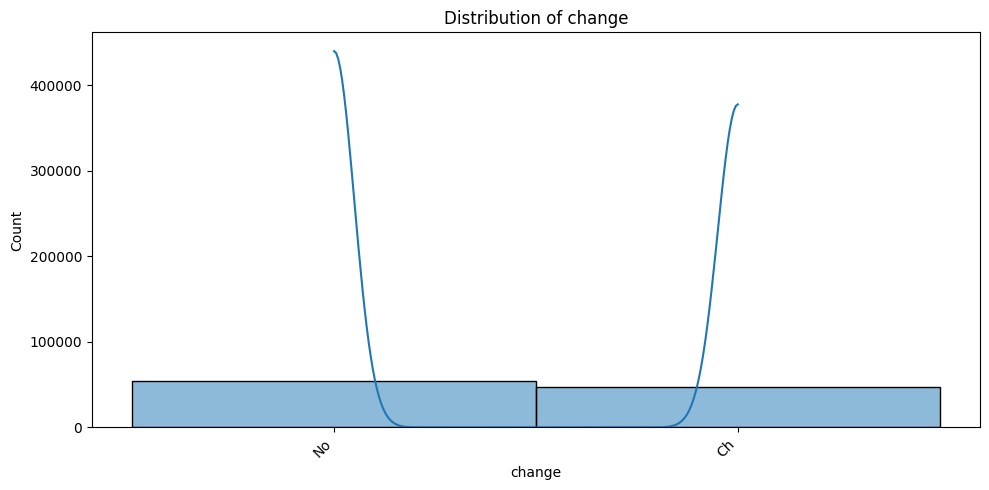

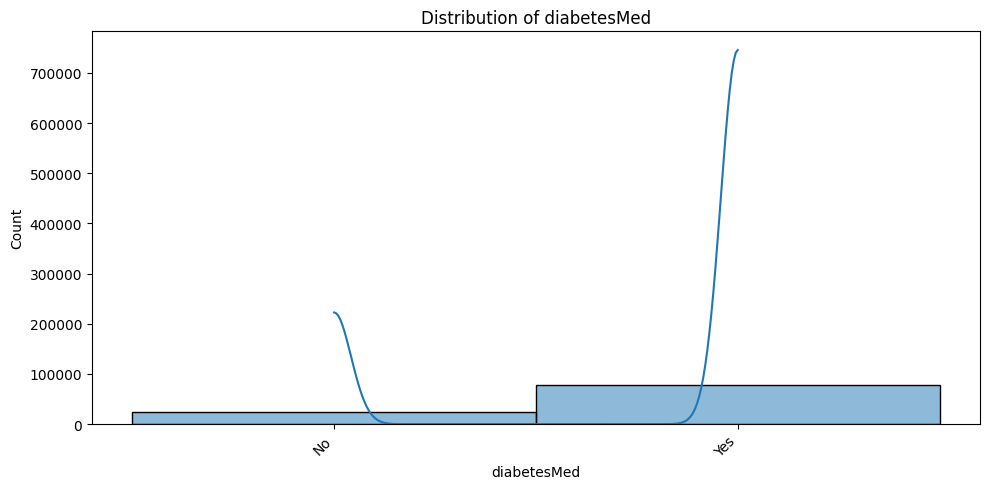

In [ ]:
# Select all columns excluding the numerical ones
diabetic_data_placeholders_substituted_nolabel = diabetic_data_placeholders_substituted.drop(columns='readmitted', inplace=False)
non_numerical_cols = diabetic_data_placeholders_substituted_nolabel.drop(columns=numerical_cols).columns

# Plot distributions for non-numerical columns separately
for col in non_numerical_cols:
    distinct_count = diabetic_data_placeholders_substituted_nolabel[col].nunique()

    # Create a new figure for each column
    plt.figure(figsize=(10, 5))

    if col == 'diag_3':
        plt.xticks([], [])  # Hide x-axis labels for diag_3 if needed

    if distinct_count > 10:  # Threshold for high-cardinality categories
        plt.xticks([], [])  # Hide x-axis labels for high-cardinality categories

    plt.xticks(rotation=45, ha="right")
    sns.histplot(diabetic_data_placeholders_substituted_nolabel[col], kde=True, bins=30)
    plt.title(f"Distribution of {col}")

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()


### Check correlation

We can plot a matrix showing the correlation of all features with each other.

In [ ]:
import pandas as pd

# Import the CSV file as a pandas DataFrame
file_path = './output_data/diabetic_data_placeholders_substituted_merged_ids_mapping.csv'
diabetic_data_placeholders_substituted_merged_ids_mapping = pd.read_csv(file_path, sep=',', encoding='utf-8')

# Display the first few rows of the DataFrame to verify the import
diabetic_data_placeholders_substituted_merged_ids_mapping.head()

C:\Users\Marco\AppData\Local\Temp\ipykernel_5532\42638331.py:5: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  diabetic_data_placeholders_substituted_merged_ids_mapping = pd.read_csv(file_path, sep=',', encoding='utf-8')


,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
0,2278392,8222157,Caucasian,Female,[0-10),NaN,6,25,1,1,NaN,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,NaN,NaN,1,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO,NaN,Not Mapped,Physician Referral
1,149190,55629189,Caucasian,Female,[10-20),NaN,1,1,7,3,NaN,NaN,59,0,18,0,0,0,276,250.01,255,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30,Emergency,Discharged to home,Emergency Room
2,64410,86047875,AfricanAmerican,Female,[20-30),NaN,1,1,7,2,NaN,NaN,11,5,13,2,0,1,648,250,V27,6,NaN,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO,Emergency,Discharged to home,Emergency Room
3,500364,82442376,Caucasian,Male,[30-40),NaN,1,1,7,2,NaN,NaN,44,1,16,0,0,0,8,250.43,403,7,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO,Emergency,Discharged to home,Emergency Room
4,16680,42519267,Caucasian,Male,[40-50),NaN,1,1,7,1,NaN,NaN,51,0,8,0,0,0,197,157,250,5,NaN,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,Emergency,Discharged to home,Emergency Room


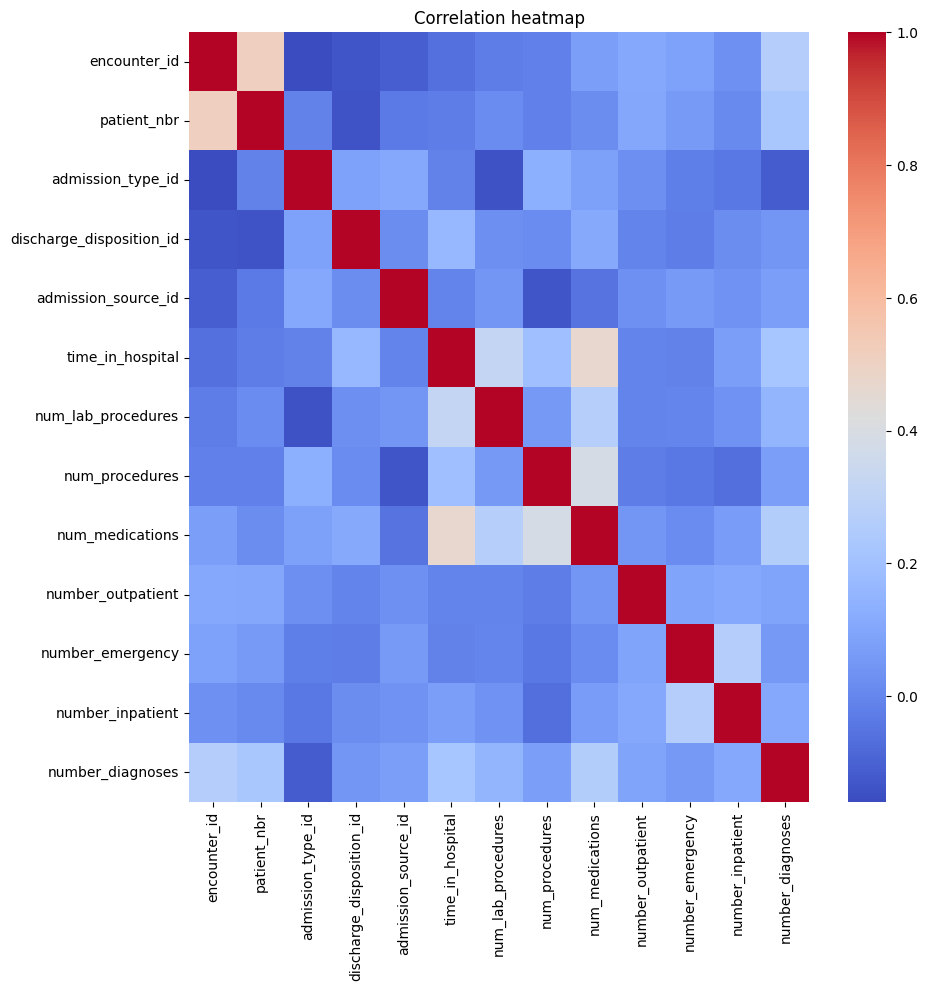

Features with correlation greater than 0.8 :



In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

# Drop non-numeric columns
non_numerical_cols = diabetic_data_placeholders_substituted_merged_ids_mapping.select_dtypes(exclude=['int64', 'float64']).columns
df = diabetic_data_placeholders_substituted_nolabel.drop(columns=non_numerical_cols, inplace=False)
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.title('Correlation heatmap')

plt.show()


# Set a threshold for correlation
threshold = 0.8

# Find pairs of features that have a correlation above the threshold
high_corr = []

# Loop through the upper triangle of the matrix to avoid duplicate pairs
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            high_corr.append((correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j]))

# Print the results
print("Features with correlation greater than", threshold, ":\n")
for feature1, feature2, corr_value in high_corr:
    print(f"{feature1} and {feature2}: {corr_value:.2f}")

In [ ]:
import pandas as pd

diabetic_data_placeholders_substituted_merged_ids_mapping = pd.read_csv("./output_data/diabetic_data_placeholders_substituted_merged_ids_mapping.csv")

C:\Users\Marco\AppData\Local\Temp\ipykernel_5532\2788162078.py:3: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  diabetic_data_placeholders_substituted_merged_ids_mapping = pd.read_csv("./output_data/diabetic_data_placeholders_substituted_merged_ids_mapping.csv")


In [ ]:
diabetic_data_placeholders_substituted_merged_ids_mapping.head()

# Check distinct values of 'readmitted' column
print(diabetic_data_placeholders_substituted_merged_ids_mapping['readmitted'].value_counts())

readmitted
NO     54864
>30    35545
<30    11357
Name: count, dtype: int64


In [ ]:
# Create a new column simplifying the classification in order to plot labels distribution
diabetic_data_placeholders_substituted_merged_ids_mapping['readmitted_yes_no'] = diabetic_data_placeholders_substituted_merged_ids_mapping['readmitted'].apply(
    lambda x: 'Readmitted' if x in ['<30', '>30'] else 'Not Readmitted'
)

In [ ]:
diabetic_data_placeholders_substituted_merged_ids_mapping.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description,readmitted_yes_no
0,2278392,8222157,Caucasian,Female,[0-10),NaN,6,25,1,1,NaN,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,NaN,NaN,1,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO,NaN,Not Mapped,Physician Referral,Not Readmitted
1,149190,55629189,Caucasian,Female,[10-20),NaN,1,1,7,3,NaN,NaN,59,0,18,0,0,0,276,250.01,255,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30,Emergency,Discharged to home,Emergency Room,Readmitted
2,64410,86047875,AfricanAmerican,Female,[20-30),NaN,1,1,7,2,NaN,NaN,11,5,13,2,0,1,648,250,V27,6,NaN,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO,Emergency,Discharged to home,Emergency Room,Not Readmitted
3,500364,82442376,Caucasian,Male,[30-40),NaN,1,1,7,2,NaN,NaN,44,1,16,0,0,0,8,250.43,403,7,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO,Emergency,Discharged to home,Emergency Room,Not Readmitted
4,16680,42519267,Caucasian,Male,[40-50),NaN,1,1,7,1,NaN,NaN,51,0,8,0,0,0,197,157,250,5,NaN,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,Emergency,Discharged to home,Emergency Room,Not Readmitted


In [ ]:
# Save the updated DataFrame to a new CSV file
diabetic_data_placeholders_substituted_merged_ids_mapping.to_csv('./output_data/diabetic_data_placeholders_substituted_merged_ids_mapping.csv', sep=',', index=False, encoding='utf-8')

In [ ]:
# Print the first few rows of the new DataFrame
display(diabetic_data_placeholders_substituted_merged_ids_mapping.head())

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description,readmitted_yes_no
0,2278392,8222157,Caucasian,Female,[0-10),NaN,6,25,1,1,NaN,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,NaN,NaN,1,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO,NaN,Not Mapped,Physician Referral,Not Readmitted
1,149190,55629189,Caucasian,Female,[10-20),NaN,1,1,7,3,NaN,NaN,59,0,18,0,0,0,276,250.01,255,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30,Emergency,Discharged to home,Emergency Room,Readmitted
2,64410,86047875,AfricanAmerican,Female,[20-30),NaN,1,1,7,2,NaN,NaN,11,5,13,2,0,1,648,250,V27,6,NaN,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO,Emergency,Discharged to home,Emergency Room,Not Readmitted
3,500364,82442376,Caucasian,Male,[30-40),NaN,1,1,7,2,NaN,NaN,44,1,16,0,0,0,8,250.43,403,7,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO,Emergency,Discharged to home,Emergency Room,Not Readmitted
4,16680,42519267,Caucasian,Male,[40-50),NaN,1,1,7,1,NaN,NaN,51,0,8,0,0,0,197,157,250,5,NaN,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,Emergency,Discharged to home,Emergency Room,Not Readmitted


Class Distribution:
readmitted_yes_no
Not Readmitted    54864
Readmitted        46902
Name: count, dtype: int64


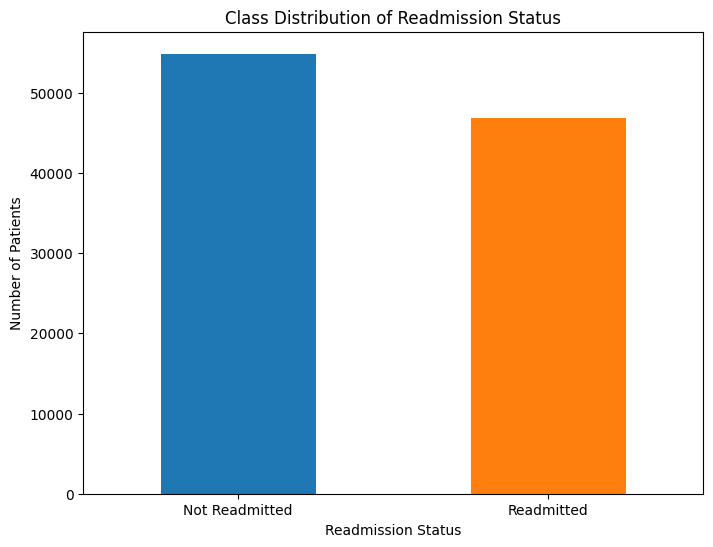

In [ ]:
import matplotlib.pyplot as plt

# Calculate class distribution
class_distribution = diabetic_data_placeholders_substituted_merged_ids_mapping['readmitted_yes_no'].value_counts()

print("Class Distribution:")
print(class_distribution)

# Plot the class distribution
plt.figure(figsize=(8, 6))
class_distribution.plot(kind='bar', color=['#1f77b4', '#ff7f0e'])
plt.title('Class Distribution of Readmission Status')
plt.xlabel('Readmission Status')
plt.ylabel('Number of Patients')
plt.xticks(rotation=0)
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def outliers(df):

    filtered_cols = [col for col in numerical_cols if col not in ['encounter_id', 'patient_nbr', 'admission_type_id', 'discharge_disposition_id', 'admission_source_id']]

    num_cols = 1
    num_rows = len(filtered_cols)

    # Boxplot for numerical columns
    plt.figure(figsize=(10, 5 * num_rows))
    sns.set_style("whitegrid")
    for i, col in enumerate(filtered_cols):
        plt.subplot(num_rows, num_cols, i + 1)
        sns.boxplot(y=col, data=df)
        plt.title(f"Boxplot of {col}")
        plt.ylabel('')
        plt.xticks(rotation=45, fontsize=10)

    plt.tight_layout()
    plt.show()

In [ ]:
# plot KDE plot for numerical columns

import seaborn as sns
import matplotlib.pyplot as plt

def kde_plot(df):

    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

    filtered_cols = [col for col in numerical_cols if col not in ['encounter_id', 'patient_nbr', 'admission_source_id', 'admission_type_id', 'discharge_disposition_id']]

    num_cols = 1
    num_rows = len(filtered_cols)

    # KDE Plot for numerical columns
    plt.figure(figsize=(10, 5 * num_rows))
    for i, col in enumerate(filtered_cols):
        plt.subplot(num_rows, num_cols, i + 1)
        sns.kdeplot(data=df, x=col, hue='readmitted_yes_no', common_norm=False)
        plt.title(f"KDE Plot of {col} by Readmission Status")

    plt.tight_layout()
    plt.savefig('./output_data/kde_plots_high_res.png', dpi=300)
    plt.show()


In [ ]:
import pandas as pd

# Read the data
diabetic_data_placeholders_substituted_merged_ids_mapping = pd.read_csv('./output_data/diabetic_data_placeholders_substituted_merged_ids_mapping.csv')

C:\Users\Marco\AppData\Local\Temp\ipykernel_6508\562595449.py:4: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  diabetic_data_placeholders_substituted_merged_ids_mapping = pd.read_csv('./output_data/diabetic_data_placeholders_substituted_merged_ids_mapping.csv')


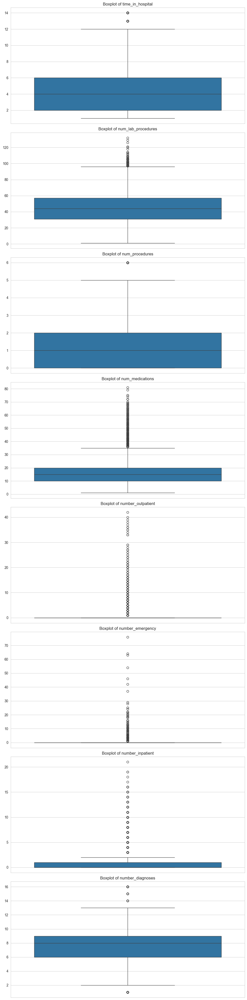

In [ ]:
numerical_cols = diabetic_data_placeholders_substituted_merged_ids_mapping.select_dtypes(include=['int64', 'float64']).columns
outliers(diabetic_data_placeholders_substituted_merged_ids_mapping)

In [ ]:
# Compute the 1.5 x IQR range for each numerical column
filtered_cols = [col for col in numerical_cols if col not in ['encounter_id', 'patient_nbr', 'admission_type_id', 'discharge_disposition_id', 'admission_source_id']]

Q1 = diabetic_data_placeholders_substituted_merged_ids_mapping[filtered_cols].quantile(0.25)
Q3 = diabetic_data_placeholders_substituted_merged_ids_mapping[filtered_cols].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Find the outliers for each numerical column
outliers = (diabetic_data_placeholders_substituted_merged_ids_mapping[filtered_cols] < lower_bound) | (diabetic_data_placeholders_substituted_merged_ids_mapping[filtered_cols] > upper_bound)


# Display the number of outliers for each numerical column
print("Number of Outliers for Each Numerical Column:")
print(outliers.sum())

# Display the percentage of outliers for each numerical column
print("\nPercentage of Outliers for Each Numerical Column:")
print(outliers.mean() * 100)

Number of Outliers for Each Numerical Column:
time_in_hospital       2252
num_lab_procedures      143
num_procedures         4954
num_medications        2557
number_outpatient     16739
number_emergency      11383
number_inpatient       7049
number_diagnoses        281
dtype: int64

Percentage of Outliers for Each Numerical Column:
time_in_hospital       2.212920
num_lab_procedures     0.140518
num_procedures         4.868031
num_medications        2.512627
number_outpatient     16.448519
number_emergency      11.185465
number_inpatient       6.926675
number_diagnoses       0.276124
dtype: float64


In [ ]:
pip install --upgrade seaborn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 25.0.1
[notice] To update, run: C:\Users\Marco\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [ ]:
import pandas as pd
# load the data
diabetic_data_placeholders_substituted_merged_ids_mapping = pd.read_csv('./output_data/diabetic_data_placeholders_substituted_merged_ids_mapping.csv')

C:\Users\Marco\AppData\Local\Temp\ipykernel_8696\894333711.py:3: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  diabetic_data_placeholders_substituted_merged_ids_mapping = pd.read_csv('./output_data/diabetic_data_placeholders_substituted_merged_ids_mapping.csv')


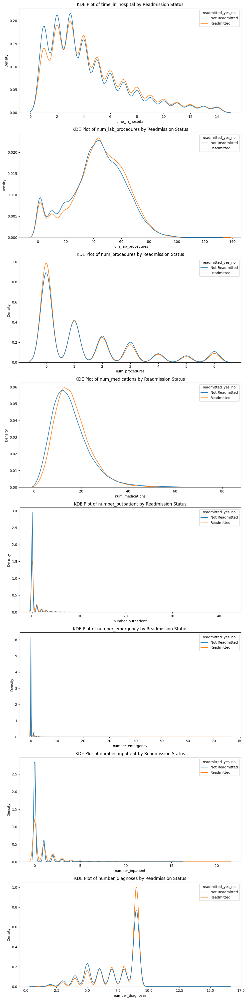

In [ ]:
kde_plot(diabetic_data_placeholders_substituted_merged_ids_mapping)

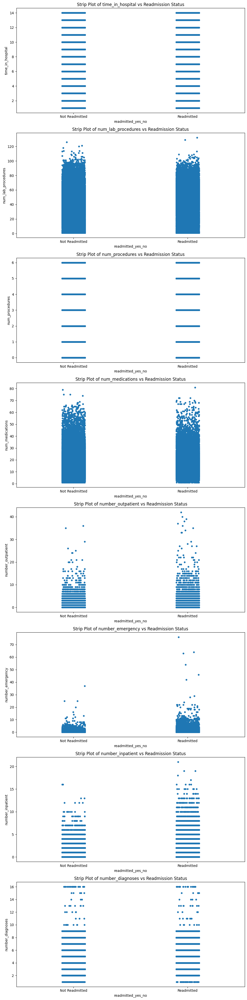

In [ ]:
# Scatter plots of features vs target variable

import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

def scatter_plot(df):
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

    filtered_cols = [col for col in numerical_cols if col not in ['encounter_id', 'patient_nbr', 'admission_source_id', 'admission_type_id', 'discharge_disposition_id']]

    num_cols = 1
    num_rows = len(filtered_cols)

    # Strip Plot for numerical columns
    plt.figure(figsize=(10, 5 * num_rows))
    for i, col in enumerate(filtered_cols):
        plt.subplot(num_rows, num_cols, i + 1)
        sns.stripplot(data=df, x='readmitted_yes_no', y=col, jitter=True)
        plt.title(f"Strip Plot of {col} vs Readmission Status")

    plt.tight_layout()
    plt.savefig('./output_data/strippot_plots_high_res.png', dpi=300)
    plt.show()


scatter_plot(diabetic_data_placeholders_substituted_merged_ids_mapping)

---

### Task 2: Data assembling and initial pre-processing (10%)
* 2.1 Assemble a dataset consisting of features and labels (e.g. X and y).
You can create a
balanced dataset and use a smaller subset of the data to decrease the
computation load (you can make a choice about the subset size depending on
your computational resources). Describe the procedure used for assembling the data.
(2.5%)
* 2.2 Describe which data cleaning and pre-processing steps are needed
(e.g. dropping
features, encoding features, data imputation). Keep in mind that some pre-processing
steps need to be embedded in the cross-validation framework to avoid data leaking.
(5%)
* 2.3 Discuss which strategy could be used to better encode the diagnoses features
(diag_1, diag_2, diag_3). (2.5%)

---

Start Task 2

In [ ]:
import pandas as pd

# Read the data
diabetic_data_placeholders_substituted_merged_ids_mapping = pd.read_csv('./diabetic_data_placeholders_substituted_merged_ids_mapping.csv')
diabetic_data_placeholders_substituted_merged_ids_mapping.drop(columns='readmitted', inplace=True)
# Visualize all columns
pd.set_option('display.max_columns', None)

# Display the first few rows of the DataFrame
display(diabetic_data_placeholders_substituted_merged_ids_mapping.head())

# Checked: The column 'readmitted_yes_no' has been added to the DataFrame

# Checked: The column 'readmitted' has been removed from the DataFrame

# Checked: admission_type_id, discharge_disposition_id, admission_source_id have been merged with the DataFrame,
# and the description columns have been added

<ipython-input-2-2c866f7cf0cd>:4: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  diabetic_data_placeholders_substituted_merged_ids_mapping = pd.read_csv('./diabetic_data_placeholders_substituted_merged_ids_mapping.csv')


,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description,readmitted_yes_no
0,2278392,8222157,Caucasian,Female,[0-10),NaN,6,25,1,1,NaN,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,NaN,NaN,1,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NaN,Not Mapped,Physician Referral,Not Readmitted
1,149190,55629189,Caucasian,Female,[10-20),NaN,1,1,7,3,NaN,NaN,59,0,18,0,0,0,276,250.01,255,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,Emergency,Discharged to home,Emergency Room,Readmitted
2,64410,86047875,AfricanAmerican,Female,[20-30),NaN,1,1,7,2,NaN,NaN,11,5,13,2,0,1,648,250,V27,6,NaN,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Emergency,Discharged to home,Emergency Room,Not Readmitted
3,500364,82442376,Caucasian,Male,[30-40),NaN,1,1,7,2,NaN,NaN,44,1,16,0,0,0,8,250.43,403,7,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,Emergency,Discharged to home,Emergency Room,Not Readmitted
4,16680,42519267,Caucasian,Male,[40-50),NaN,1,1,7,1,NaN,NaN,51,0,8,0,0,0,197,157,250,5,NaN,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Emergency,Discharged to home,Emergency Room,Not Readmitted


2.1 Data Assembling

In [ ]:
import pandas as pd

# Global variable to control "subset" mode to decrease the computation load for experimentation
USE_SUBSET = True

print("Size of the dataset before subset: ", diabetic_data_placeholders_substituted_merged_ids_mapping.shape)

# Function to create a subset if USE_SUBSET is True
def create_subset(df, subset_size=0.15): # Default subset size is 15%, for experimentation
    if USE_SUBSET:
        print(f"Using {subset_size*100}% of the dataset for experimentation.")

        # Sample a subset of the dataset
        df_subset = df.sample(frac=subset_size, random_state=42)
        return df_subset

    else:
        print("Using the full dataset.")
        return df

Size of the dataset before subset:  (101766, 53)


In [ ]:
# Create the subset or use the full dataset based on the global variable
df_selected = create_subset(diabetic_data_placeholders_substituted_merged_ids_mapping, subset_size=0.05)

# Separate features and labels
y = df_selected['readmitted_yes_no']  # Labels
X = df_selected.drop(columns=['readmitted_yes_no'])  # Features

print("Size of the dataset after subset: ", df_selected.shape)

# Proceed with downstream tasks (preprocessing, model training, etc.)
display("Features:", X.head())
display("Labels: ", y.head())

Using 5.0% of the dataset for experimentation.
Size of the dataset after subset:  (5088, 53)


'Features:'

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
35956,110939484,19274094,Caucasian,Female,[70-80),NaN,1,1,6,11,UN,InternalMedicine,68,0,20,0,0,0,250.8,599,263,5,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,Emergency,Discharged to home,Transfer from another health care facility
60927,170328306,65634327,Caucasian,Male,[50-60),NaN,1,1,1,1,HM,NaN,20,0,7,0,0,0,780,427,E941,8,NaN,NaN,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Emergency,Discharged to home,Physician Referral
79920,245688426,100657359,Caucasian,Female,[60-70),NaN,3,6,1,4,HM,NaN,21,3,23,1,0,2,715,733,724,7,NaN,NaN,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Elective,Discharged/transferred to home with home healt...,Physician Referral
50078,150826224,83144448,Caucasian,Male,[30-40),NaN,2,1,1,12,CP,Gastroenterology,28,0,19,0,0,1,494,277,117,7,NaN,NaN,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Urgent,Discharged to home,Physician Referral
44080,135993852,65234214,AfricanAmerican,Female,[60-70),NaN,1,2,7,1,NaN,NaN,21,0,6,0,0,0,403,584,428,7,NaN,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Emergency,Discharged/transferred to another short term h...,Emergency Room


'Labels: '

,readmitted_yes_no
35956,Not Readmitted
60927,Not Readmitted
79920,Not Readmitted
50078,Readmitted
44080,Readmitted


In [ ]:
display("Features:", X.shape)
display("Labels: ", y.shape)

'Features:'

(5088, 52)

'Labels: '

(5088,)

In [ ]:
# Calculate class distribution
class_distribution = diabetic_data_placeholders_substituted_merged_ids_mapping['readmitted_yes_no'].value_counts()

print("Class Distribution:")
print(class_distribution)

# Print the class ratio
class_ratio = class_distribution / class_distribution.sum()
print("\nClass Ratio:")
print(class_ratio)

Class Distribution:
readmitted_yes_no
Not Readmitted    54864
Readmitted        46902
Name: count, dtype: int64

Class Ratio:
readmitted_yes_no
Not Readmitted    0.539119
Readmitted        0.460881
Name: count, dtype: float64


---

#### Preprocessing

In [ ]:
# Split the data into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
display(X_train.head())

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
95706,365473358,40927806,Caucasian,Female,[40-50),NaN,3,1,1,6,WC,Orthopedics,24,1,24,0,0,1,836,337,836,7,NaN,NaN,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,Elective,Discharged to home,Physician Referral
35363,109646196,15761691,Caucasian,Female,[40-50),NaN,1,1,6,2,MD,InternalMedicine,57,0,5,0,0,0,298,401,250,5,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Transfer from another health care facility
49747,150311874,101130669,Caucasian,Male,[70-80),NaN,1,1,7,5,MC,NaN,53,2,19,0,0,0,427,496,790,9,NaN,NaN,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Emergency,Discharged to home,Emergency Room
95129,357313562,71437527,Caucasian,Female,[60-70),NaN,2,6,1,3,BC,Podiatry,40,1,18,0,0,0,250.82,730,731,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Down,No,No,No,No,No,Ch,Yes,Urgent,Discharged/transferred to home with home healt...,Physician Referral
26100,86314722,21196017,Caucasian,Male,[70-80),NaN,3,6,1,5,NaN,NaN,43,2,16,0,0,0,511,250,401,8,NaN,NaN,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Elective,Discharged/transferred to home with home healt...,Physician Referral


In [ ]:
# Check missing values in the training set
missing_values = X_train.isnull().sum()
missing_values_percentage = (missing_values / len(X_train)) * 100

# Order the missing values percentage in ascending order
missing_values_percentage = missing_values_percentage.sort_values(ascending=False)

print("Missing Values percentage in Training Set:")
print(missing_values_percentage)

Missing Values percentage in Training Set:
weight                                  96.683047
max_glu_serum                           94.791155
A1Cresult                               83.095823
medical_specialty                       48.796069
payer_code                              39.238329
admission_source_id_description          6.732187
admission_type_id_description            5.528256
discharge_disposition_id_description     3.636364
race                                     2.211302
diag_3                                   1.474201
diag_2                                   0.343980
diag_1                                   0.024570
admission_source_id                      0.000000
time_in_hospital                         0.000000
encounter_id                             0.000000
patient_nbr                              0.000000
gender                                   0.000000
admission_type_id                        0.000000
discharge_disposition_id                 0.000000
age    

In [ ]:
# Print the type of missing values columns
print("\nData Types of Columns with Missing Values:")
print((missing_values_percentage[missing_values_percentage > 0.02]))


Data Types of Columns with Missing Values:
weight                                  96.855500
max_glu_serum                           94.740333
A1Cresult                               83.253083
medical_specialty                       49.094728
payer_code                              39.472068
admission_source_id_description          6.637842
admission_type_id_description            5.130693
discharge_disposition_id_description     3.649339
race                                     2.240456
diag_3                                   1.389230
diag_2                                   0.332875
diag_1                                   0.020881
dtype: float64


In [ ]:
# Drop weight column as it has more than 96% missing values
X_train.drop(columns=['weight'], inplace=True)
display(X_train.head())

# Drop weight column from the test set as well
X_test.drop(columns=['weight'], inplace=True)
display(X_test.head())

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
95706,365473358,40927806,Caucasian,Female,[40-50),3,1,1,6,WC,Orthopedics,24,1,24,0,0,1,836,337,836,7,NaN,NaN,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,Elective,Discharged to home,Physician Referral
35363,109646196,15761691,Caucasian,Female,[40-50),1,1,6,2,MD,InternalMedicine,57,0,5,0,0,0,298,401,250,5,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Transfer from another health care facility
49747,150311874,101130669,Caucasian,Male,[70-80),1,1,7,5,MC,NaN,53,2,19,0,0,0,427,496,790,9,NaN,NaN,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Emergency,Discharged to home,Emergency Room
95129,357313562,71437527,Caucasian,Female,[60-70),2,6,1,3,BC,Podiatry,40,1,18,0,0,0,250.82,730,731,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Down,No,No,No,No,No,Ch,Yes,Urgent,Discharged/transferred to home with home healt...,Physician Referral
26100,86314722,21196017,Caucasian,Male,[70-80),3,6,1,5,NaN,NaN,43,2,16,0,0,0,511,250,401,8,NaN,NaN,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Elective,Discharged/transferred to home with home healt...,Physician Referral


,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
101034,433852202,92627325,Caucasian,Female,[60-70),2,1,7,6,MC,Emergency/Trauma,43,1,21,1,1,2,998,790,523,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,Urgent,Discharged to home,Emergency Room
11010,46046310,19316196,Caucasian,Female,[80-90),3,18,4,2,NaN,PhysicalMedicineandRehabilitation,45,0,8,0,0,1,V57,410,396,9,NaN,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Elective,NaN,Transfer from a hospital
43857,135355074,41581485,Caucasian,Female,[70-80),1,4,7,11,MC,NaN,41,2,11,0,0,0,491,276,410,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,Emergency,Discharged/transferred to ICF,Emergency Room
48027,147068184,56378853,Caucasian,Male,[70-80),2,3,1,12,NaN,Oncology,57,1,12,0,0,0,486,599,204,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,Urgent,Discharged/transferred to SNF,Physician Referral
47784,146668458,101034954,AfricanAmerican,Female,[70-80),1,1,7,2,CM,NaN,52,0,4,0,0,0,599,401,530,4,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room


In [ ]:
# Drop max_glu_serum column as it has more than 95% missing values
X_train.drop(columns=['max_glu_serum'], inplace=True)
display(X_train.head())

# Drop max_glu_serum column from the test set as well
X_test.drop(columns=['max_glu_serum'], inplace=True)
display(X_test.head())

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
95706,365473358,40927806,Caucasian,Female,[40-50),3,1,1,6,WC,Orthopedics,24,1,24,0,0,1,836,337,836,7,NaN,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,Elective,Discharged to home,Physician Referral
35363,109646196,15761691,Caucasian,Female,[40-50),1,1,6,2,MD,InternalMedicine,57,0,5,0,0,0,298,401,250,5,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Transfer from another health care facility
49747,150311874,101130669,Caucasian,Male,[70-80),1,1,7,5,MC,NaN,53,2,19,0,0,0,427,496,790,9,NaN,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Emergency,Discharged to home,Emergency Room
95129,357313562,71437527,Caucasian,Female,[60-70),2,6,1,3,BC,Podiatry,40,1,18,0,0,0,250.82,730,731,9,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Down,No,No,No,No,No,Ch,Yes,Urgent,Discharged/transferred to home with home healt...,Physician Referral
26100,86314722,21196017,Caucasian,Male,[70-80),3,6,1,5,NaN,NaN,43,2,16,0,0,0,511,250,401,8,NaN,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Elective,Discharged/transferred to home with home healt...,Physician Referral


,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
101034,433852202,92627325,Caucasian,Female,[60-70),2,1,7,6,MC,Emergency/Trauma,43,1,21,1,1,2,998,790,523,9,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,Urgent,Discharged to home,Emergency Room
11010,46046310,19316196,Caucasian,Female,[80-90),3,18,4,2,NaN,PhysicalMedicineandRehabilitation,45,0,8,0,0,1,V57,410,396,9,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Elective,NaN,Transfer from a hospital
43857,135355074,41581485,Caucasian,Female,[70-80),1,4,7,11,MC,NaN,41,2,11,0,0,0,491,276,410,9,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,Emergency,Discharged/transferred to ICF,Emergency Room
48027,147068184,56378853,Caucasian,Male,[70-80),2,3,1,12,NaN,Oncology,57,1,12,0,0,0,486,599,204,9,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,Urgent,Discharged/transferred to SNF,Physician Referral
47784,146668458,101034954,AfricanAmerican,Female,[70-80),1,1,7,2,CM,NaN,52,0,4,0,0,0,599,401,530,4,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room


In [ ]:
# Drop A1Cresult column as it has more than 80% missing values
X_train.drop(columns=['A1Cresult'], inplace=True)
display(X_train.head())

# Drop A1Cresult column from the test set as well
X_test.drop(columns=['A1Cresult'], inplace=True)
display(X_test.head())

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
95706,365473358,40927806,Caucasian,Female,[40-50),3,1,1,6,WC,Orthopedics,24,1,24,0,0,1,836,337,836,7,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,Elective,Discharged to home,Physician Referral
35363,109646196,15761691,Caucasian,Female,[40-50),1,1,6,2,MD,InternalMedicine,57,0,5,0,0,0,298,401,250,5,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Transfer from another health care facility
49747,150311874,101130669,Caucasian,Male,[70-80),1,1,7,5,MC,NaN,53,2,19,0,0,0,427,496,790,9,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Emergency,Discharged to home,Emergency Room
95129,357313562,71437527,Caucasian,Female,[60-70),2,6,1,3,BC,Podiatry,40,1,18,0,0,0,250.82,730,731,9,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Down,No,No,No,No,No,Ch,Yes,Urgent,Discharged/transferred to home with home healt...,Physician Referral
26100,86314722,21196017,Caucasian,Male,[70-80),3,6,1,5,NaN,NaN,43,2,16,0,0,0,511,250,401,8,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Elective,Discharged/transferred to home with home healt...,Physician Referral


,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
101034,433852202,92627325,Caucasian,Female,[60-70),2,1,7,6,MC,Emergency/Trauma,43,1,21,1,1,2,998,790,523,9,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,Urgent,Discharged to home,Emergency Room
11010,46046310,19316196,Caucasian,Female,[80-90),3,18,4,2,NaN,PhysicalMedicineandRehabilitation,45,0,8,0,0,1,V57,410,396,9,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Elective,NaN,Transfer from a hospital
43857,135355074,41581485,Caucasian,Female,[70-80),1,4,7,11,MC,NaN,41,2,11,0,0,0,491,276,410,9,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,Emergency,Discharged/transferred to ICF,Emergency Room
48027,147068184,56378853,Caucasian,Male,[70-80),2,3,1,12,NaN,Oncology,57,1,12,0,0,0,486,599,204,9,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,Urgent,Discharged/transferred to SNF,Physician Referral
47784,146668458,101034954,AfricanAmerican,Female,[70-80),1,1,7,2,CM,NaN,52,0,4,0,0,0,599,401,530,4,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room


Save the train and test set in .csv files after dropping columns

In [ ]:
# Save the updated training and testing sets to CSV files
X_train.to_csv('./X_train_drop_high_percentage_missing_values.csv', index=False)
X_test.to_csv('./X_test_drop_high_percentage_missing_values.csv', index=False)

In [ ]:
# Save y_train and y_test to CSV files to retrieve them in Task 3
y_train.to_csv('./y_train.csv', index=False)
y_test.to_csv('./y_test.csv', index=False)

In [ ]:
print("y_train and y_test:")
print(y_train.head())
print(y_test.head())

y_train and y_test:
95706    Not Readmitted
35363    Not Readmitted
49747        Readmitted
95129        Readmitted
26100    Not Readmitted
Name: readmitted_yes_no, dtype: object
101034    Not Readmitted
11010         Readmitted
43857     Not Readmitted
48027         Readmitted
47784         Readmitted
Name: readmitted_yes_no, dtype: object


In [ ]:
# Print the number of samples and features in the training set
print("Training Set - Number of Samples and Features:")
print(X_train.shape)

Training Set - Number of Samples and Features:
(81412, 49)


In [ ]:
display(X_train.head())

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
24079,81844290,94788,Caucasian,Female,[70-80),1,1,7,4,NaN,InternalMedicine,48,0,11,0,0,0,276,402,428,9,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room
98079,396159158,135023315,Caucasian,Male,[50-60),1,1,7,1,BC,NaN,42,0,5,0,0,0,427,250,278,6,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room
6237,31258956,18397782,Caucasian,Male,[80-90),1,1,7,4,NaN,NaN,44,0,10,0,0,0,599,788,599,7,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Emergency,Discharged to home,Emergency Room
72208,210691074,67509558,Caucasian,Male,[80-90),1,3,7,3,MC,NaN,54,0,8,0,0,0,331,309,331,8,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Emergency,Discharged/transferred to SNF,Emergency Room
33075,104902980,23272362,AfricanAmerican,Female,[70-80),1,11,7,11,MC,Nephrology,35,3,23,0,0,1,38,486,403,8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Expired,Emergency Room


---

Tests for imputation, encoding, and scaling strategies in the subsequent cells

In [ ]:
# Checking the distribution of payer_code and missing values
df = X_train.copy()

# Concatenate the features and labels
df['readmitted_yes_no'] = y_train
display(df.head())

missing_data = df[df['payer_code'].isnull()]
display(missing_data.head())

print("Missing Values in payer_code:")
print(missing_data['medical_specialty'].size)

# Check if readmission is influenced by missing payer_code
print("Distribution of readmission in missing payer_code:")
print(missing_data['readmitted_yes_no'].value_counts())



,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description,readmitted_yes_no
24079,81844290,94788,Caucasian,Female,[70-80),1,1,7,4,NaN,InternalMedicine,48,0,11,0,0,0,276,402,428,9,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room,Not Readmitted
98079,396159158,135023315,Caucasian,Male,[50-60),1,1,7,1,BC,NaN,42,0,5,0,0,0,427,250,278,6,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room,Readmitted
6237,31258956,18397782,Caucasian,Male,[80-90),1,1,7,4,NaN,NaN,44,0,10,0,0,0,599,788,599,7,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Emergency,Discharged to home,Emergency Room,Not Readmitted
72208,210691074,67509558,Caucasian,Male,[80-90),1,3,7,3,MC,NaN,54,0,8,0,0,0,331,309,331,8,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Emergency,Discharged/transferred to SNF,Emergency Room,Not Readmitted
33075,104902980,23272362,AfricanAmerican,Female,[70-80),1,11,7,11,MC,Nephrology,35,3,23,0,0,1,38,486,403,8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Expired,Emergency Room,Not Readmitted


,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description,readmitted_yes_no
24079,81844290,94788,Caucasian,Female,[70-80),1,1,7,4,NaN,InternalMedicine,48,0,11,0,0,0,276,402,428,9,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room,Not Readmitted
6237,31258956,18397782,Caucasian,Male,[80-90),1,1,7,4,NaN,NaN,44,0,10,0,0,0,599,788,599,7,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Emergency,Discharged to home,Emergency Room,Not Readmitted
12913,51999162,19832265,NaN,Male,[40-50),3,18,1,4,NaN,NaN,24,6,11,0,0,0,414,411,412,5,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Elective,NaN,Physician Referral,Not Readmitted
79358,243417654,1868706,Caucasian,Male,[80-90),1,6,7,8,NaN,NaN,57,5,19,0,1,1,537,584,276,9,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,Emergency,Discharged/transferred to home with home healt...,Emergency Room,Not Readmitted
33019,104804010,101019033,AfricanAmerican,Male,[60-70),6,2,7,5,NaN,NaN,73,3,16,0,0,3,596,496,599,6,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NaN,Discharged/transferred to another short term h...,Emergency Room,Readmitted


Missing Values in payer_code:
32135
Distribution of readmission in missing payer_code:
readmitted_yes_no
Not Readmitted    17364
Readmitted        14771
Name: count, dtype: int64


In [ ]:
# Test Imputing missing values in the training set for payer_code column
from sklearn.impute import SimpleImputer

constant_fill = 'Unknown'

# Initialize the SimpleImputer with the constant strategy
imputer = SimpleImputer(strategy='constant', fill_value=constant_fill)

# Fit and transform the 'payer_code' column in the training set
imputer.fit(X_train[['payer_code']])
X_train[['payer_code']] = imputer.transform(X_train[['payer_code']])

# Check the missing values in payer_code after imputation
print("Number of missing values in payer_code after imputation:")
payer_code_current_missing_values = X_train[['payer_code']].isnull().sum()
print(payer_code_current_missing_values)

Number of missing values in payer_code after imputation:
payer_code    0
dtype: int64


---

In [ ]:
# handling missing values in medical_specialty column

# Checking the distribution of medical_specialty and missing values
df = X_train.copy()

# Concatenate the features and labels
df['readmitted_yes_no'] = y_train
display(df.head())

missing_data = df[df['medical_specialty'].isnull()]
display(missing_data.head())

print("Missing Values in medical_specialty:")
print(missing_data['medical_specialty'].size)

# Check if readmission is influenced by missing medical_specialty
print("Distribution of readmission in missing medical_specialty:")
print(missing_data['readmitted_yes_no'].value_counts())

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description,readmitted_yes_no
24079,81844290,94788,Caucasian,Female,[70-80),1,1,7,4,Unknown,InternalMedicine,48,0,11,0,0,0,276,402,428,9,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room,Not Readmitted
98079,396159158,135023315,Caucasian,Male,[50-60),1,1,7,1,BC,NaN,42,0,5,0,0,0,427,250,278,6,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room,Readmitted
6237,31258956,18397782,Caucasian,Male,[80-90),1,1,7,4,Unknown,NaN,44,0,10,0,0,0,599,788,599,7,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Emergency,Discharged to home,Emergency Room,Not Readmitted
72208,210691074,67509558,Caucasian,Male,[80-90),1,3,7,3,MC,NaN,54,0,8,0,0,0,331,309,331,8,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Emergency,Discharged/transferred to SNF,Emergency Room,Not Readmitted
33075,104902980,23272362,AfricanAmerican,Female,[70-80),1,11,7,11,MC,Nephrology,35,3,23,0,0,1,38,486,403,8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Expired,Emergency Room,Not Readmitted


,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description,readmitted_yes_no
98079,396159158,135023315,Caucasian,Male,[50-60),1,1,7,1,BC,NaN,42,0,5,0,0,0,427,250,278,6,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room,Readmitted
6237,31258956,18397782,Caucasian,Male,[80-90),1,1,7,4,Unknown,NaN,44,0,10,0,0,0,599,788,599,7,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Emergency,Discharged to home,Emergency Room,Not Readmitted
72208,210691074,67509558,Caucasian,Male,[80-90),1,3,7,3,MC,NaN,54,0,8,0,0,0,331,309,331,8,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Emergency,Discharged/transferred to SNF,Emergency Room,Not Readmitted
12913,51999162,19832265,NaN,Male,[40-50),3,18,1,4,Unknown,NaN,24,6,11,0,0,0,414,411,412,5,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Elective,NaN,Physician Referral,Not Readmitted
81022,250443612,38173338,Caucasian,Female,[60-70),1,6,7,6,MC,NaN,45,0,24,0,0,3,491,427,427,9,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Emergency,Discharged/transferred to home with home healt...,Emergency Room,Readmitted


Missing Values in medical_specialty:
39969
Distribution of readmission in missing medical_specialty:
readmitted_yes_no
Not Readmitted    20761
Readmitted        19208
Name: count, dtype: int64


In [ ]:
# Imputin missing values in the training set for medical_specialty column
from sklearn.impute import SimpleImputer

constant_fill = 'Unknown'

# Initialize the SimpleImputer with the constant strategy
imputer = SimpleImputer(strategy='constant', fill_value=constant_fill)

# Fit and transform the 'medical_specialty' column in the training set
imputer.fit(X_train[['medical_specialty']])
X_train[['medical_specialty']] = imputer.transform(X_train[['medical_specialty']])

# Check the missing values in medical_specialty after imputation
print("Number of missing values in medical_specialty after imputation:")
medical_specialty_current_missing_values = X_train[['medical_specialty']].isnull().sum()
print(medical_specialty_current_missing_values)

Number of missing values in medical_specialty after imputation:
medical_specialty    0
dtype: int64


---

In [ ]:
# Handling the remaining missing values: admission_source_id_description, admission_source_id_description,
# admission_type_id_description, discharge_disposition_id_description, race, diag_3, diag_2, diag_1

import pandas as pd
from sklearn.impute import SimpleImputer

# Identify categorical features remained with missing values
categorical_columns = ['admission_source_id_description',
                        'admission_type_id_description',
                        'discharge_disposition_id_description',
                        'race', 'diag_3', 'diag_2', 'diag_1']


# Define the imputer for categorical features using the most frequent value (mode)
imputer = SimpleImputer(strategy='most_frequent')

# Apply imputer to only the selected categorical columns
X_train[categorical_columns] = imputer.fit_transform(X_train[categorical_columns])

# Check if missing values are imputed
missing_values = X_train[categorical_columns].isnull().sum()
print("Missing Values in Categorical Columns after Imputation:")
print(missing_values)


Missing Values in Categorical Columns after Imputation:
admission_source_id_description         0
admission_type_id_description           0
discharge_disposition_id_description    0
race                                    0
diag_3                                  0
diag_2                                  0
diag_1                                  0
dtype: int64


---

### Encoding of features

Which is best for SVM:

* One-Hot Encoding is often preferred for nominal categorical features because it avoids implying any kind of order, which might confuse the SVM. However, it can result in high dimensionality for features with many categories.
* Label Encoding can work for ordinal features, but for nominal features, it may introduce artificial relationships between categories that SVMs might interpret incorrectly.
* Binary Encoding or Frequency Encoding might be good alternatives when dealing with categorical features with many levels or when dimensionality needs to be controlled.

Below, the type of categorical features in the dataset is checked to choose the appropriate encoding

In [ ]:
# 1. Identification of all categorical features
import pandas as pd

numerical_cols = X_train.select_dtypes(include=['int64', 'float64']).columns
categorical_columns = X_train.drop(columns=numerical_cols).columns

display(X_train.shape)
display(X_train[categorical_columns].head())


(81412, 49)

,race,gender,age,payer_code,medical_specialty,diag_1,diag_2,diag_3,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
24079,Caucasian,Female,[70-80),Unknown,InternalMedicine,276,402,428,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room
98079,Caucasian,Male,[50-60),BC,Unknown,427,250,278,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room
6237,Caucasian,Male,[80-90),Unknown,Unknown,599,788,599,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Emergency,Discharged to home,Emergency Room
72208,Caucasian,Male,[80-90),MC,Unknown,331,309,331,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Emergency,Discharged/transferred to SNF,Emergency Room
33075,AfricanAmerican,Female,[70-80),MC,Nephrology,38,486,403,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Expired,Emergency Room


In [ ]:
# 2. Check for cardinality of categorical features
cardinality = X_train[categorical_columns].nunique()
print(cardinality)


race                                      5
gender                                    3
age                                      10
payer_code                               18
medical_specialty                        72
diag_1                                  691
diag_2                                  714
diag_3                                  761
metformin                                 4
repaglinide                               4
nateglinide                               4
chlorpropamide                            4
glimepiride                               4
acetohexamide                             2
glipizide                                 4
glyburide                                 4
tolbutamide                               2
pioglitazone                              4
rosiglitazone                             4
acarbose                                  4
miglitol                                  4
troglitazone                              2
tolazamide                      

##### Encoding Logic:
* For ordinal features were used label encoding to preserve their inherent ordering
* All other features are encoded using One-Hot-Encoding strategy

In [ ]:
# Print all the distinct values of age column
print(X_train['age'].unique())

['[70-80)' '[50-60)' '[80-90)' '[40-50)' '[60-70)' '[30-40)' '[10-20)'
 '[90-100)' '[20-30)' '[0-10)']


In [ ]:
# Print all the distinct values in  "metformin", "repaglinide", "nateglinide", "chlorpropamide",
# "glimepiride", "acetohexamide", "glipizide", "glyburide", "tolbutamide", "pioglitazone",
# "rosiglitazone","acarbose","miglitol","troglitazone","tolazamide","examide","citoglipton","insulin",
# "glyburide-metformin","glipizide-metformin","glimepiride-pioglitazone","metformin-rosiglitazone",
# "metformin-pioglitazone"
for col in ["metformin",
    "repaglinide",
    "nateglinide",
    "chlorpropamide",
    "glimepiride",
    "acetohexamide",
    "glipizide",
    "glyburide",
    "tolbutamide",
    "pioglitazone",
    "rosiglitazone",
    "acarbose",
    "miglitol",
    "troglitazone",
    "tolazamide",
    "examide",
    "citoglipton",
    "insulin",
    "glyburide-metformin",
    "glipizide-metformin",
    "glimepiride-pioglitazone",
    "metformin-rosiglitazone",
    "metformin-pioglitazone" ]:
    print(col, ":", X_train[col].unique())

metformin : ['No' 'Steady' 'Down' 'Up']
repaglinide : ['No' 'Steady' 'Down' 'Up']
nateglinide : ['No' 'Up' 'Steady' 'Down']
chlorpropamide : ['No' 'Steady' 'Up' 'Down']
glimepiride : ['No' 'Steady' 'Up' 'Down']
acetohexamide : ['No' 'Steady']
glipizide : ['No' 'Steady' 'Up' 'Down']
glyburide : ['No' 'Steady' 'Down' 'Up']
tolbutamide : ['No' 'Steady']
pioglitazone : ['No' 'Steady' 'Up' 'Down']
rosiglitazone : ['No' 'Steady' 'Down' 'Up']
acarbose : ['No' 'Steady' 'Up' 'Down']
miglitol : ['No' 'Steady' 'Down' 'Up']
troglitazone : ['No' 'Steady']
tolazamide : ['No' 'Steady' 'Up']
examide : ['No']
citoglipton : ['No']
insulin : ['No' 'Steady' 'Down' 'Up']
glyburide-metformin : ['No' 'Steady' 'Up' 'Down']
glipizide-metformin : ['No' 'Steady']
glimepiride-pioglitazone : ['No' 'Steady']
metformin-rosiglitazone : ['No' 'Steady']
metformin-pioglitazone : ['No' 'Steady']


In [ ]:
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder

# Select ordinal features:
ordinal_features = [
    'age',
    "metformin",
    "repaglinide",
    "nateglinide",
    "chlorpropamide",
    "glimepiride",
    "acetohexamide",
    "glipizide",
    "glyburide",
    "tolbutamide",
    "pioglitazone",
    "rosiglitazone",
    "acarbose",
    "miglitol",
    "troglitazone",
    "tolazamide",
    "examide",
    "citoglipton",
    "insulin",
    "glyburide-metformin",
    "glipizide-metformin",
    "glimepiride-pioglitazone",
    "metformin-rosiglitazone",
    "metformin-pioglitazone"
]


# Define the order of the categories for each feature
age_order = [
    '[0-10)',
    '[10-20)',
    '[20-30)',
    '[30-40)',
    '[40-50)',
    '[50-60)',
    '[60-70)',
    '[70-80)',
    '[80-90)',
    '[90-100)'
]
metformin_order = ['No', 'Steady', 'Down', 'Up']
repaglinide_order = ['No', 'Steady', 'Down', 'Up']
nateglinide_order = ['No', 'Steady', 'Down', 'Up']
chlorpropamide_order = ['No', 'Steady', 'Down', 'Up']
glimepiride_order = ['No', 'Steady', 'Down', 'Up']
acetohexamide_order = ['No', 'Steady']
glipizide_order = ['No', 'Steady', 'Down', 'Up']
glyburide_order = ['No', 'Steady', 'Down', 'Up']
tolbutamide_order = ['No', 'Steady']
pioglitazone_order = ['No', 'Steady', 'Down', 'Up']
rosiglitazone_order = ['No', 'Steady', 'Down', 'Up']
acarbose_order = ['No', 'Steady', 'Down', 'Up']
miglitol_order = ['No', 'Steady', 'Down', 'Up']
troglitazone_order = ['No', 'Steady']
tolazamide_order = ['No', 'Steady', 'Up']
examide_order = ['No']
citoglipton_order = ['No']
insulin_order = ['No', 'Steady', 'Down', 'Up']
glyburide_metformin_order = ['No', 'Steady', 'Down', 'Up']
glipizide_metformin_order = ['No', 'Steady']
glimepiride_pioglitazone_order = ['No', 'Steady']
metformin_rosiglitazone_order = ['No', 'Steady']
metformin_pioglitazone_order = ['No', 'Steady']


# Initialize the OrdinalEncoder for multiple columns
encoder = OrdinalEncoder(categories=[
    age_order, metformin_order, repaglinide_order, nateglinide_order, chlorpropamide_order,
    glimepiride_order, acetohexamide_order, glipizide_order, glyburide_order, tolbutamide_order,
    pioglitazone_order, rosiglitazone_order, acarbose_order, miglitol_order, troglitazone_order,
    tolazamide_order, examide_order, citoglipton_order, insulin_order, glyburide_metformin_order,
    glipizide_metformin_order, glimepiride_pioglitazone_order, metformin_rosiglitazone_order,
    metformin_pioglitazone_order
])

# Fit and transform the data
train_encoded = encoder.fit_transform(X_train[ordinal_features])
test_encoded = encoder.transform(X_test[ordinal_features])

# Before
print("X_train before encoding:")
display(X_train[ordinal_features])
print("X_test before encoding:")
display(X_test[ordinal_features])

# Reset indices for consistency and combine data
X_train = X_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)

X_train[ordinal_features] = train_encoded
X_test[ordinal_features] = test_encoded

# after
print("X_train after encoding:")
display(X_train[ordinal_features])
print("X_test after encoding")
display(X_test[ordinal_features])


X_train before encoding:


,age,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone
24079,[70-80),No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
98079,[50-60),No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
6237,[80-90),No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
72208,[80-90),No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No
33075,[70-80),No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6265,[70-80),No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
54886,[60-70),Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No
76820,[70-80),No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Down,No,No,No,No,No
860,[60-70),No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Down,No,No,No,No,No


X_test before encoding:


,age,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone
35956,[70-80),No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No
60927,[50-60),Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
79920,[60-70),Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
50078,[30-40),No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No
44080,[60-70),No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16156,[80-90),No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No
67386,[40-50),Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No
81342,[70-80),Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No
72915,[70-80),No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No


X_train after encoding:


,age,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone
0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81407,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
81408,6.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0
81409,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0
81410,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0


X_test after encoding


,age,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone
0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,6.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20349,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
20350,4.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
20351,7.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20352,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


---

In [ ]:
# Step 1: Exclude ordinal features from the selection

non_ordinal_features = [col for col in X_train[categorical_columns] if col not in ordinal_features]

print("Non-Ordinal Categorical Features:")
print(non_ordinal_features)

# Step 2: Calculate cardinality for each feature
cardinality_dict = {col: X_train[col].nunique() for col in non_ordinal_features}

# Step 3: Classify features by cardinality
below_10 = [col for col, cardinality in cardinality_dict.items() if cardinality < 10]
between_10_and_50 = [col for col, cardinality in cardinality_dict.items() if 10 <= cardinality <= 50]
above_50 = [col for col, cardinality in cardinality_dict.items() if cardinality > 50]

print("Cardinality dict:")
print(cardinality_dict)

# Display the features grouped by cardinality
print("Features with cardinality below 10:", below_10, "\n")
print("Features with cardinality between 10 and 50:", between_10_and_50, "\n")
print("Features with cardinality above 50:", above_50)


Non-Ordinal Categorical Features:
['race', 'gender', 'payer_code', 'medical_specialty', 'diag_1', 'diag_2', 'diag_3', 'change', 'diabetesMed', 'admission_type_id_description', 'discharge_disposition_id_description', 'admission_source_id_description']
Cardinality dict:
{'race': 5, 'gender': 3, 'payer_code': 18, 'medical_specialty': 72, 'diag_1': 691, 'diag_2': 714, 'diag_3': 761, 'change': 2, 'diabetesMed': 2, 'admission_type_id_description': 7, 'discharge_disposition_id_description': 25, 'admission_source_id_description': 16}
Features with cardinality below 10: ['race', 'gender', 'change', 'diabetesMed', 'admission_type_id_description'] 

Features with cardinality between 10 and 50: ['payer_code', 'discharge_disposition_id_description', 'admission_source_id_description'] 

Features with cardinality above 50: ['medical_specialty', 'diag_1', 'diag_2', 'diag_3']


In [ ]:
# Display comparison between ordinal and non-ordinal features
print("Ordinal Features, already encoded:")
display(X_train[ordinal_features].head())

print("Non-Ordinal Features, not encoded yet:")
display(X_train[non_ordinal_features].head())

Ordinal Features, already encoded:


,age,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone
0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Non-Ordinal Features, not encoded yet:


,race,gender,payer_code,medical_specialty,diag_1,diag_2,diag_3,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
0,Caucasian,Female,Unknown,InternalMedicine,276,402,428,No,No,Emergency,Discharged to home,Emergency Room
1,Caucasian,Male,BC,Unknown,427,250,278,No,No,Emergency,Discharged to home,Emergency Room
2,Caucasian,Male,Unknown,Unknown,599,788,599,No,Yes,Emergency,Discharged to home,Emergency Room
3,Caucasian,Male,MC,Unknown,331,309,331,Ch,Yes,Emergency,Discharged/transferred to SNF,Emergency Room
4,AfricanAmerican,Female,MC,Nephrology,38,486,403,No,No,Emergency,Expired,Emergency Room


In [ ]:
# Extraction of features related to diag_1, diag_2, diag_3
diag_features = ['diag_1', 'diag_2', 'diag_3']

# The above features were in above_50 list, so consequently, they were not encoded below:
above_50 = ['medical_specialty']

In [ ]:
# Step 4: One-Hot Encoding for features with cardinality below 10
from sklearn.preprocessing import OneHotEncoder

# Initialize the OneHotEncoder
onehot_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Fit on training data and apply to both train and test
train_onehot_encoded = onehot_encoder.fit_transform(X_train[below_10])
test_onehot_encoded = onehot_encoder.transform(X_test[below_10])

print("Below 10 Cardinality Features:")
print(below_10, "\n")

# Create DataFrames for the encoded columns
train_encoded_df = pd.DataFrame(train_onehot_encoded, columns=onehot_encoder.get_feature_names_out(below_10))
test_encoded_df = pd.DataFrame(test_onehot_encoded, columns=onehot_encoder.get_feature_names_out(below_10))

# Before
print("X_train before encoding:")
display(X_train[below_10])
print("X_test before encoding:")
display(X_test[below_10])

# Reset indices for consistency and combine data
X_train = X_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)

X_train = pd.concat([X_train.drop(below_10, axis=1), train_encoded_df.reset_index(drop=True)], axis=1)
X_test = pd.concat([X_test.drop(below_10, axis=1), test_encoded_df.reset_index(drop=True)], axis=1)



# after
print("X_train after encoding:")
display(X_train.head())
print("X_test after encoding")
display(X_test.head())

Below 10 Cardinality Features:
['race', 'gender', 'change', 'diabetesMed', 'admission_type_id_description'] 

X_train before encoding:


,race,gender,change,diabetesMed,admission_type_id_description
0,Caucasian,Female,No,No,Emergency
1,Caucasian,Male,No,No,Emergency
2,Caucasian,Male,No,Yes,Emergency
3,Caucasian,Male,Ch,Yes,Emergency
4,AfricanAmerican,Female,No,No,Emergency
...,...,...,...,...,...
81407,Caucasian,Male,No,No,Emergency
81408,Caucasian,Male,Ch,Yes,Not Available
81409,Caucasian,Male,Ch,Yes,Elective
81410,Caucasian,Female,Ch,Yes,Emergency


X_test before encoding:


,race,gender,change,diabetesMed,admission_type_id_description
0,Caucasian,Female,No,Yes,Emergency
1,Caucasian,Male,No,Yes,Emergency
2,Caucasian,Female,No,Yes,Elective
3,Caucasian,Male,No,Yes,Urgent
4,AfricanAmerican,Female,No,Yes,Emergency
...,...,...,...,...,...
20349,Caucasian,Male,No,Yes,Emergency
20350,Caucasian,Male,Ch,Yes,Elective
20351,Caucasian,Female,No,Yes,Emergency
20352,Caucasian,Male,No,Yes,Urgent


X_train after encoding:


,encounter_id,patient_nbr,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,discharge_disposition_id_description,admission_source_id_description,race_AfricanAmerican,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Female,gender_Male,gender_Unknown/Invalid,change_Ch,change_No,diabetesMed_No,diabetesMed_Yes,admission_type_id_description_Elective,admission_type_id_description_Emergency,admission_type_id_description_Newborn,admission_type_id_description_Not Available,admission_type_id_description_Not Mapped,admission_type_id_description_Trauma Center,admission_type_id_description_Urgent
0,81844290,94788,7.0,1,1,7,4,Unknown,InternalMedicine,48,0,11,0,0,0,276,402,428,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Discharged to home,Emergency Room,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,396159158,135023315,5.0,1,1,7,1,BC,Unknown,42,0,5,0,0,0,427,250,278,6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Discharged to home,Emergency Room,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,31258956,18397782,8.0,1,1,7,4,Unknown,Unknown,44,0,10,0,0,0,599,788,599,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Discharged to home,Emergency Room,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,210691074,67509558,8.0,1,3,7,3,MC,Unknown,54,0,8,0,0,0,331,309,331,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Discharged/transferred to SNF,Emergency Room,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,104902980,23272362,7.0,1,11,7,11,MC,Nephrology,35,3,23,0,0,1,38,486,403,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Expired,Emergency Room,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


X_test after encoding


,encounter_id,patient_nbr,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,discharge_disposition_id_description,admission_source_id_description,race_AfricanAmerican,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Female,gender_Male,gender_Unknown/Invalid,change_Ch,change_No,diabetesMed_No,diabetesMed_Yes,admission_type_id_description_Elective,admission_type_id_description_Emergency,admission_type_id_description_Newborn,admission_type_id_description_Not Available,admission_type_id_description_Not Mapped,admission_type_id_description_Trauma Center,admission_type_id_description_Urgent
0,110939484,19274094,7.0,NaN,1,1,6,11,UN,InternalMedicine,68,0,20,0,0,0,250.8,599,263,5,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Discharged to home,Transfer from another health care facility,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,170328306,65634327,5.0,NaN,1,1,1,1,HM,NaN,20,0,7,0,0,0,780,427,E941,8,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Discharged to home,Physician Referral,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,245688426,100657359,6.0,NaN,3,6,1,4,HM,NaN,21,3,23,1,0,2,715,733,724,7,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Discharged/transferred to home with home healt...,Physician Referral,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,150826224,83144448,3.0,NaN,2,1,1,12,CP,Gastroenterology,28,0,19,0,0,1,494,277,117,7,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Discharged to home,Physician Referral,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,135993852,65234214,6.0,NaN,1,2,7,1,NaN,NaN,21,0,6,0,0,0,403,584,428,7,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Discharged/transferred to another short term h...,Emergency Room,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


---

In [ ]:
# pip install category_encoders

In [ ]:
# Step 5: Binary Encoding for features with cardinality above 10 (exluded diag_1, diag_2, diag_3)
from category_encoders import BinaryEncoder

# Concat features
between_10_and_50 = ['payer_code', 'discharge_disposition_id_description', 'admission_source_id_description', 'medical_specialty']

# Check the appending of the feature
print("Features above 10:")
print(between_10_and_50)

# Before
print("X_train before encoding:")
display(X_train[between_10_and_50])
print("X_test before encoding:")
display(X_test[between_10_and_50])

# Initialize the BinaryEncoder
binary_encoder = BinaryEncoder()

# Fit and transform the training set
df_train_binary_encoded = binary_encoder.fit_transform(X_train[between_10_and_50])
# Transform the test set using the same encoder (without fitting it again)
df_test_binary_encoded = binary_encoder.transform(X_test[between_10_and_50])


# After
print("Train After encoding:")
display(df_train_binary_encoded.head())
print("Test After encoding:")
display(df_test_binary_encoded.head())

# Remove the original columns from the training and test sets
X_train.drop(columns=between_10_and_50, inplace=True)
X_test.drop(columns=between_10_and_50, inplace=True)

# Concatenate the binary-encoded features with the remaining columns
X_train = pd.concat([X_train.reset_index(drop=True), df_train_binary_encoded.reset_index(drop=True)], axis=1)
X_test = pd.concat([X_test.reset_index(drop=True), df_test_binary_encoded.reset_index(drop=True)], axis=1)

# After
print("X_train after encoding:")
display(X_train.head())
print("X_test after encoding:")
display(X_test.head())

Features above 10:
['payer_code', 'discharge_disposition_id_description', 'admission_source_id_description', 'medical_specialty']
X_train before encoding:


,payer_code,discharge_disposition_id_description,admission_source_id_description,medical_specialty
0,Unknown,Discharged to home,Emergency Room,InternalMedicine
1,BC,Discharged to home,Emergency Room,Unknown
2,Unknown,Discharged to home,Emergency Room,Unknown
3,MC,Discharged/transferred to SNF,Emergency Room,Unknown
4,MC,Expired,Emergency Room,Nephrology
...,...,...,...,...
81407,Unknown,Discharged to home,Emergency Room,Cardiology
81408,HM,Discharged to home,Physician Referral,Unknown
81409,MC,Discharged/transferred to SNF,Physician Referral,Orthopedics
81410,Unknown,Not Mapped,Emergency Room,Family/GeneralPractice


X_test before encoding:


,payer_code,discharge_disposition_id_description,admission_source_id_description,medical_specialty
0,UN,Discharged to home,Transfer from another health care facility,InternalMedicine
1,HM,Discharged to home,Physician Referral,NaN
2,HM,Discharged/transferred to home with home healt...,Physician Referral,NaN
3,CP,Discharged to home,Physician Referral,Gastroenterology
4,NaN,Discharged/transferred to another short term h...,Emergency Room,NaN
...,...,...,...,...
20349,NaN,Discharged to home,Emergency Room,NaN
20350,BC,Discharged to home,Physician Referral,NaN
20351,HM,Discharged to home,Emergency Room,NaN
20352,MC,Discharged to home,Emergency Room,Surgery-General


Train After encoding:


,payer_code_0,payer_code_1,payer_code_2,payer_code_3,payer_code_4,discharge_disposition_id_description_0,discharge_disposition_id_description_1,discharge_disposition_id_description_2,discharge_disposition_id_description_3,discharge_disposition_id_description_4,admission_source_id_description_0,admission_source_id_description_1,admission_source_id_description_2,admission_source_id_description_3,admission_source_id_description_4,medical_specialty_0,medical_specialty_1,medical_specialty_2,medical_specialty_3,medical_specialty_4,medical_specialty_5,medical_specialty_6
0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1
1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0
2,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0
3,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
4,0,0,0,1,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,1


Test After encoding:


,payer_code_0,payer_code_1,payer_code_2,payer_code_3,payer_code_4,discharge_disposition_id_description_0,discharge_disposition_id_description_1,discharge_disposition_id_description_2,discharge_disposition_id_description_3,discharge_disposition_id_description_4,admission_source_id_description_0,admission_source_id_description_1,admission_source_id_description_2,admission_source_id_description_3,admission_source_id_description_4,medical_specialty_0,medical_specialty_1,medical_specialty_2,medical_specialty_3,medical_specialty_4,medical_specialty_5,medical_specialty_6
0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1
1,0,1,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
2,0,1,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,1
4,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0


X_train after encoding:


,encounter_id,patient_nbr,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,race_AfricanAmerican,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Female,gender_Male,gender_Unknown/Invalid,change_Ch,change_No,diabetesMed_No,diabetesMed_Yes,admission_type_id_description_Elective,admission_type_id_description_Emergency,admission_type_id_description_Newborn,admission_type_id_description_Not Available,admission_type_id_description_Not Mapped,admission_type_id_description_Trauma Center,admission_type_id_description_Urgent,payer_code_0,payer_code_1,payer_code_2,payer_code_3,payer_code_4,discharge_disposition_id_description_0,discharge_disposition_id_description_1,discharge_disposition_id_description_2,discharge_disposition_id_description_3,discharge_disposition_id_description_4,admission_source_id_description_0,admission_source_id_description_1,admission_source_id_description_2,admission_source_id_description_3,admission_source_id_description_4,medical_specialty_0,medical_specialty_1,medical_specialty_2,medical_specialty_3,medical_specialty_4,medical_specialty_5,medical_specialty_6
0,81844290,94788,7.0,1,1,7,4,48,0,11,0,0,0,276,402,428,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1
1,396159158,135023315,5.0,1,1,7,1,42,0,5,0,0,0,427,250,278,6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0
2,31258956,18397782,8.0,1,1,7,4,44,0,10,0,0,0,599,788,599,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0
3,210691074,67509558,8.0,1,3,7,3,54,0,8,0,0,0,331,309,331,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
4,104902980,23272362,7.0,1,11,7,11,35,3,23,0,0,1,38,486,403,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,1


X_test after encoding:


,encounter_id,patient_nbr,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,race_AfricanAmerican,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Female,gender_Male,gender_Unknown/Invalid,change_Ch,change_No,diabetesMed_No,diabetesMed_Yes,admission_type_id_description_Elective,admission_type_id_description_Emergency,admission_type_id_description_Newborn,admission_type_id_description_Not Available,admission_type_id_description_Not Mapped,admission_type_id_description_Trauma Center,admission_type_id_description_Urgent,payer_code_0,payer_code_1,payer_code_2,payer_code_3,payer_code_4,discharge_disposition_id_description_0,discharge_disposition_id_description_1,discharge_disposition_id_description_2,discharge_disposition_id_description_3,discharge_disposition_id_description_4,admission_source_id_description_0,admission_source_id_description_1,admission_source_id_description_2,admission_source_id_description_3,admission_source_id_description_4,medical_specialty_0,medical_specialty_1,medical_specialty_2,medical_specialty_3,medical_specialty_4,medical_specialty_5,medical_specialty_6
0,110939484,19274094,7.0,NaN,1,1,6,11,68,0,20,0,0,0,250.8,599,263,5,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1
1,170328306,65634327,5.0,NaN,1,1,1,1,20,0,7,0,0,0,780,427,E941,8,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
2,245688426,100657359,6.0,NaN,3,6,1,4,21,3,23,1,0,2,715,733,724,7,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,150826224,83144448,3.0,NaN,2,1,1,12,28,0,19,0,0,1,494,277,117,7,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,1
4,135993852,65234214,6.0,NaN,1,2,7,1,21,0,6,0,0,0,403,584,428,7,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
# Check the size of the training and test sets
print("Training Set Size:", X_train.shape)
print("Test Set Size:", X_test.shape)

# The Test set contains the three columns dropped in the training set. As expected.

Training Set Size: (81412, 81)
Test Set Size: (20354, 84)


---

Choose a strategy for encoding of diag_1, 2 and 3:
* Given the high cardinality, Binary Enconding is applied:

In [ ]:
# Step 5: Binary Encoding for diag_1, diag_2, diag_3 features
from category_encoders import BinaryEncoder

# Concat features
diag_features = ['diag_1', 'diag_2', 'diag_3']

# Check the appending of the feature
print("Features:")
print(diag_features)

# Before
print("X_train_final before encoding:")
display(X_train[diag_features])
print("X_test_final before encoding:")
display(X_test[diag_features])

# Initialize the BinaryEncoder
binary_encoder = BinaryEncoder()

# Fit and transform the training set
df_train_binary_encoded_diags = binary_encoder.fit_transform(X_train[diag_features])
# Transform the test set using the same encoder (without fitting it again)
df_test_binary_encoded_diags = binary_encoder.transform(X_test[diag_features])


# After
print("Train After encoding:")
display(df_train_binary_encoded_diags.head())
print("Test After encoding:")
display(df_test_binary_encoded_diags.head())

# Remove the original columns from the training and test sets
X_train.drop(columns=diag_features, inplace=True)
X_test.drop(columns=diag_features, inplace=True)

# Concatenate the binary-encoded features with the remaining columns
X_train = pd.concat([X_train.reset_index(drop=True), df_train_binary_encoded_diags.reset_index(drop=True)], axis=1)
X_test = pd.concat([X_test.reset_index(drop=True), df_test_binary_encoded_diags.reset_index(drop=True)], axis=1)

# After
print("X_train after encoding:")
display(X_train.head())
print("X_test after encoding:")
display(X_test.head())

Features:
['diag_1', 'diag_2', 'diag_3']
X_train_final before encoding:


,diag_1,diag_2,diag_3
0,276,402,428
1,427,250,278
2,599,788,599
3,331,309,331
4,38,486,403
...,...,...,...
81407,786,427,414
81408,682,799,112
81409,715,401,272
81410,515,482,599


X_test_final before encoding:


,diag_1,diag_2,diag_3
0,250.8,599,263
1,780,427,E941
2,715,733,724
3,494,277,117
4,403,584,428
...,...,...,...
20349,486,428,427
20350,197,162,250
20351,578,276,427
20352,577,574,414


Train After encoding:


,diag_1_0,diag_1_1,diag_1_2,diag_1_3,diag_1_4,diag_1_5,diag_1_6,diag_1_7,diag_1_8,diag_1_9,diag_2_0,diag_2_1,diag_2_2,diag_2_3,diag_2_4,diag_2_5,diag_2_6,diag_2_7,diag_2_8,diag_2_9,diag_3_0,diag_3_1,diag_3_2,diag_3_3,diag_3_4,diag_3_5,diag_3_6,diag_3_7,diag_3_8,diag_3_9
0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1


Test After encoding:


,diag_1_0,diag_1_1,diag_1_2,diag_1_3,diag_1_4,diag_1_5,diag_1_6,diag_1_7,diag_1_8,diag_1_9,diag_2_0,diag_2_1,diag_2_2,diag_2_3,diag_2_4,diag_2_5,diag_2_6,diag_2_7,diag_2_8,diag_2_9,diag_3_0,diag_3_1,diag_3_2,diag_3_3,diag_3_4,diag_3_5,diag_3_6,diag_3_7,diag_3_8,diag_3_9
0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,1,0,0,1,1
1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,1,1,0,1,0,1,1,0,1,1,1
2,0,0,0,1,0,0,0,0,1,1,0,0,1,1,0,0,0,1,0,1,0,0,1,1,0,0,0,1,0,1
3,1,0,0,0,0,1,0,1,1,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,1,1,1,1
4,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1


X_train after encoding:


,encounter_id,patient_nbr,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,race_AfricanAmerican,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Female,gender_Male,gender_Unknown/Invalid,change_Ch,change_No,diabetesMed_No,diabetesMed_Yes,admission_type_id_description_Elective,admission_type_id_description_Emergency,admission_type_id_description_Newborn,admission_type_id_description_Not Available,admission_type_id_description_Not Mapped,admission_type_id_description_Trauma Center,admission_type_id_description_Urgent,payer_code_0,payer_code_1,payer_code_2,payer_code_3,payer_code_4,discharge_disposition_id_description_0,discharge_disposition_id_description_1,discharge_disposition_id_description_2,discharge_disposition_id_description_3,discharge_disposition_id_description_4,admission_source_id_description_0,admission_source_id_description_1,admission_source_id_description_2,admission_source_id_description_3,admission_source_id_description_4,medical_specialty_0,medical_specialty_1,medical_specialty_2,medical_specialty_3,medical_specialty_4,medical_specialty_5,medical_specialty_6,diag_1_0,diag_1_1,diag_1_2,diag_1_3,diag_1_4,diag_1_5,diag_1_6,diag_1_7,diag_1_8,diag_1_9,diag_2_0,diag_2_1,diag_2_2,diag_2_3,diag_2_4,diag_2_5,diag_2_6,diag_2_7,diag_2_8,diag_2_9,diag_3_0,diag_3_1,diag_3_2,diag_3_3,diag_3_4,diag_3_5,diag_3_6,diag_3_7,diag_3_8,diag_3_9
0,81844290,94788,7.0,1,1,7,4,48,0,11,0,0,0,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
1,396159158,135023315,5.0,1,1,7,1,42,0,5,0,0,0,6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
2,31258956,18397782,8.0,1,1,7,4,44,0,10,0,0,0,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1
3,210691074,67509558,8.0,1,3,7,3,54,0,8,0,0,0,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
4,104902980,23272362,7.0,1,11,7,11,35,3,23,0,0,1,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1


X_test after encoding:


,encounter_id,patient_nbr,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,race_AfricanAmerican,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Female,gender_Male,gender_Unknown/Invalid,change_Ch,change_No,diabetesMed_No,diabetesMed_Yes,admission_type_id_description_Elective,admission_type_id_description_Emergency,admission_type_id_description_Newborn,admission_type_id_description_Not Available,admission_type_id_description_Not Mapped,admission_type_id_description_Trauma Center,admission_type_id_description_Urgent,payer_code_0,payer_code_1,payer_code_2,payer_code_3,payer_code_4,discharge_disposition_id_description_0,discharge_disposition_id_description_1,discharge_disposition_id_description_2,discharge_disposition_id_description_3,discharge_disposition_id_description_4,admission_source_id_description_0,admission_source_id_description_1,admission_source_id_description_2,admission_source_id_description_3,admission_source_id_description_4,medical_specialty_0,medical_specialty_1,medical_specialty_2,medical_specialty_3,medical_specialty_4,medical_specialty_5,medical_specialty_6,diag_1_0,diag_1_1,diag_1_2,diag_1_3,diag_1_4,diag_1_5,diag_1_6,diag_1_7,diag_1_8,diag_1_9,diag_2_0,diag_2_1,diag_2_2,diag_2_3,diag_2_4,diag_2_5,diag_2_6,diag_2_7,diag_2_8,diag_2_9,diag_3_0,diag_3_1,diag_3_2,diag_3_3,diag_3_4,diag_3_5,diag_3_6,diag_3_7,diag_3_8,diag_3_9
0,110939484,19274094,7.0,NaN,1,1,6,11,68,0,20,0,0,0,5,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,1,0,0,1,1
1,170328306,65634327,5.0,NaN,1,1,1,1,20,0,7,0,0,0,8,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,1,1,0,1,0,1,1,0,1,1,1
2,245688426,100657359,6.0,NaN,3,6,1,4,21,3,23,1,0,2,7,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,1,1,0,0,0,1,0,1,0,0,1,1,0,0,0,1,0,1
3,150826224,83144448,3.0,NaN,2,1,1,12,28,0,19,0,0,1,7,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,1,1,0,0,0,0,1,0,1,1,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,1,1,1,1
4,135993852,65234214,6.0,NaN,1,2,7,1,21,0,6,0,0,0,7,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1


---

In [ ]:
# Label Encoding for the target variable
label_encoder = LabelEncoder()

y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Before
print("y_train before encoding:")
display(y_train.head())
print("y_test before encoding:")
display(y_test.head())

# After
print("y_train after encoding:")
display(y_train_encoded)
print("y_test after encoding:")
display(y_test_encoded)

# Replacing and check
y_train = y_train_encoded
y_test = y_test_encoded
print("Replaced y_train:")
display(y_train)
print("Replaced y_test:")
display(y_test)

y_train before encoding:


24079    Not Readmitted
98079        Readmitted
6237     Not Readmitted
72208    Not Readmitted
33075    Not Readmitted
Name: readmitted_yes_no, dtype: object

y_test before encoding:


35956    Not Readmitted
60927    Not Readmitted
79920    Not Readmitted
50078        Readmitted
44080        Readmitted
Name: readmitted_yes_no, dtype: object

y_train after encoding:


array([0, 1, 0, ..., 0, 1, 0])

y_test after encoding:


array([0, 0, 0, ..., 1, 1, 0])

Replaced y_train:


array([0, 1, 0, ..., 0, 1, 0])

Replaced y_test:


array([0, 0, 0, ..., 1, 1, 0])

---

Scaling

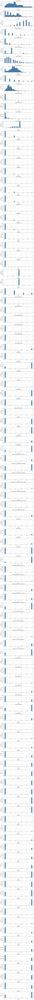

In [ ]:
import matplotlib.pyplot as plt
import math

num_features = X_train.shape[1]

# Adjust the figure size dynamically based on the number of features
fig, axes = plt.subplots(nrows=num_features, ncols=1, figsize=(10, num_features * 3))

# Plot each feature
for i, ax in enumerate(axes):
    feature_name = X_train.columns[i]
    X_train.iloc[:, i].hist(bins=30, ax=ax, color='steelblue', edgecolor='black')
    ax.set_title(f'{feature_name}')  # Add titles for each plot
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

# Add spacing between plots
plt.subplots_adjust(hspace=0.5)

plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform the training set
X_train_scaled = scaler.fit_transform(X_train)

# Drop - A1Cresult
# - max_glu_serum
# - weight for consistency from the test set
X_test.drop(columns=['weight', 'max_glu_serum', 'A1Cresult'], inplace=True)

# Transform the test set using the same scaler
X_test_scaled = scaler.transform(X_test)

# Convert the scaled NumPy arrays back to DataFrames
X_train = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test = pd.DataFrame(X_test_scaled, columns=X_test.columns)


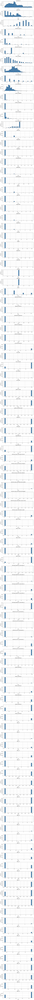

In [ ]:
import matplotlib.pyplot as plt
import math

num_features = X_train.shape[1]

# Adjust the figure size dynamically based on the number of features
fig, axes = plt.subplots(nrows=num_features, ncols=1, figsize=(10, num_features * 3))

# Plot each feature
for i, ax in enumerate(axes):
    feature_name = X_train.columns[i]
    X_train.iloc[:, i].hist(bins=30, ax=ax, color='steelblue', edgecolor='black')
    ax.set_title(f'{feature_name}')  # Add titles for each plot
    ax.set_xlabel('Value after scaling')
    ax.set_ylabel('Frequency')

# Add spacing between plots
plt.subplots_adjust(hspace=0.5)

plt.show()

---

### Task 3

3.3 Pipeline for hyper-parameter tuning and model comparison

Pipeline to optimize the regularization hyperparameters of different linear models (SVM, Random Forest Classifier, and XGBoost) and chose the best model for predicting the target. Printing the average cross-validation performance (with the standard deviation) as well as the test performance.

In [ ]:
# pip install xgboost


[notice] A new release of pip is available: 23.1.2 -> 25.0.1
[notice] To update, run: C:\Users\Marco\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



                                              0.0/150.0 MB ? eta -:--:--
                                              0.4/150.0 MB 8.2 MB/s eta 0:00:19
                                             1.1/150.0 MB 11.7 MB/s eta 0:00:13
                                             1.8/150.0 MB 12.7 MB/s eta 0:00:12
                                             2.7/150.0 MB 14.1 MB/s eta 0:00:11
                                             3.5/150.0 MB 14.9 MB/s eta 0:00:10
     -                                       4.5/150.0 MB 16.1 MB/s eta 0:00:10
     -                                       5.6/150.0 MB 17.1 MB/s eta 0:00:09
     -                                       6.7/150.0 MB 17.7 MB/s eta 0:00:09
     -                                       7.6/150.0 MB 18.1 MB/s eta 0:00:08
     --                                      8.7/150.0 MB 18.5 MB/s eta 0:00:08
     --                                      9.7/150.0 MB 18.8 MB/s eta 0:00:08
     --                                     10

---

Start Task 3

In [ ]:
# Import csv file
import pandas as pd

# Load the data
X_train = pd.read_csv('./X_train_drop_high_percentage_missing_values.csv')
X_test = pd.read_csv('./X_test_drop_high_percentage_missing_values.csv')

# Check the first few rows of the training set
display(X_train.head())

# Check the first few rows of the test set
display(X_test.head())

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
0,365473358,40927806,Caucasian,Female,[40-50),3,1,1,6,WC,Orthopedics,24,1,24,0,0,1,836,337,836,7,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,Elective,Discharged to home,Physician Referral
1,109646196,15761691,Caucasian,Female,[40-50),1,1,6,2,MD,InternalMedicine,57,0,5,0,0,0,298,401,250,5,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Transfer from another health care facility
2,150311874,101130669,Caucasian,Male,[70-80),1,1,7,5,MC,NaN,53,2,19,0,0,0,427,496,790,9,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,Emergency,Discharged to home,Emergency Room
3,357313562,71437527,Caucasian,Female,[60-70),2,6,1,3,BC,Podiatry,40,1,18,0,0,0,250.82,730,731,9,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Down,No,No,No,No,No,Ch,Yes,Urgent,Discharged/transferred to home with home healt...,Physician Referral
4,86314722,21196017,Caucasian,Male,[70-80),3,6,1,5,NaN,NaN,43,2,16,0,0,0,511,250,401,8,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Elective,Discharged/transferred to home with home healt...,Physician Referral


,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,admission_type_id_description,discharge_disposition_id_description,admission_source_id_description
0,433852202,92627325,Caucasian,Female,[60-70),2,1,7,6,MC,Emergency/Trauma,43,1,21,1,1,2,998,790,523,9,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,Urgent,Discharged to home,Emergency Room
1,46046310,19316196,Caucasian,Female,[80-90),3,18,4,2,NaN,PhysicalMedicineandRehabilitation,45,0,8,0,0,1,V57,410,396,9,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,Elective,NaN,Transfer from a hospital
2,135355074,41581485,Caucasian,Female,[70-80),1,4,7,11,MC,NaN,41,2,11,0,0,0,491,276,410,9,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,Emergency,Discharged/transferred to ICF,Emergency Room
3,147068184,56378853,Caucasian,Male,[70-80),2,3,1,12,NaN,Oncology,57,1,12,0,0,0,486,599,204,9,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,Urgent,Discharged/transferred to SNF,Physician Referral
4,146668458,101034954,AfricanAmerican,Female,[70-80),1,1,7,2,CM,NaN,52,0,4,0,0,0,599,401,530,4,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Emergency,Discharged to home,Emergency Room


In [ ]:
# Load the labels
y_train = pd.read_csv('./y_train.csv')
y_test = pd.read_csv('./y_test.csv')

# Check the first few rows of the training labels
display(y_train.head())
display(y_test.head())

,readmitted_yes_no
0,Not Readmitted
1,Not Readmitted
2,Readmitted
3,Readmitted
4,Not Readmitted


,readmitted_yes_no
0,Not Readmitted
1,Readmitted
2,Not Readmitted
3,Readmitted
4,Readmitted


In [ ]:
# Encoding the target variable
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

y_train = label_encoder.fit_transform(y_train)
y_test = label_encoder.transform(y_test)


print("Transformed y_train:")
display(y_train)
print("Transformed y_test:")
display(y_test)

Transformed y_train:


/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_label.py:110: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_label.py:129: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


array([0, 0, 1, ..., 1, 1, 1])

Transformed y_test:


array([0, 1, 0, ..., 0, 0, 1])

In [ ]:
# pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.0 MB/s eta 0:00:00


In [ ]:
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import GridSearchCV
#from category_encoders import BinaryEncoder
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
#import category_encoders as ce

RANDOM_STATE = 42

---

Features splitting based on their type, and definition of preprocessor for the downstream task

In [ ]:
numerical_cols = X_train.select_dtypes(include=['int64', 'float64']).columns
print(numerical_cols)

Index(['encounter_id', 'patient_nbr', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient',
       'number_diagnoses'],
      dtype='object')


In [ ]:
# List of expected columns
expected_columns = ['age', "metformin","repaglinide","nateglinide","chlorpropamide","glimepiride",
                        "acetohexamide","glipizide","glyburide",
                        "tolbutamide","pioglitazone","rosiglitazone","acarbose","miglitol","troglitazone",
                        "tolazamide","examide","citoglipton","insulin","glyburide-metformin","glipizide-metformin",
                        "glimepiride-pioglitazone","metformin-rosiglitazone","metformin-pioglitazone"
    ] + ['race', 'gender', 'change', 'diabetesMed', 'admission_type_id_description'] + ['payer_code', 'discharge_disposition_id_description', 'admission_source_id_description',
    'medical_specialty', 'diag_1', 'diag_2', 'diag_3'] + ['encounter_id', 'patient_nbr', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient',
       'number_diagnoses']

# Check if all expected columns are in X_train
missing_columns = [col for col in expected_columns if col not in X_train.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
else:
    print("All expected columns are present.")

# Check if all columns in X_train.colums are in expected_columns
missing_columns_2 = [col for col in X_train.columns if col not in expected_columns]
if missing_columns_2:
    print(f"Missing columns: {missing_columns}")
else:
    print("All columns in X_train are in expected_columns.")


All expected columns are present.
All columns in X_train are in expected_columns.


---

In [ ]:
def create_preprocessor():
    # Ordinal features:
    ordinal_features = ['age', "metformin","repaglinide","nateglinide","chlorpropamide","glimepiride",
                        "acetohexamide","glipizide","glyburide",
                        "tolbutamide","pioglitazone","rosiglitazone","acarbose","miglitol","troglitazone",
                        "tolazamide","examide","citoglipton","insulin","glyburide-metformin","glipizide-metformin",
                        "glimepiride-pioglitazone","metformin-rosiglitazone","metformin-pioglitazone"
    ]

    # Orders for ordinal features
    age_order = [
        '[0-10)',
        '[10-20)',
        '[20-30)',
        '[30-40)',
        '[40-50)',
        '[50-60)',
        '[60-70)',
        '[70-80)',
        '[80-90)',
        '[90-100)'
    ]

    metformin_order = ['No', 'Steady', 'Down', 'Up']
    repaglinide_order = ['No', 'Steady', 'Down', 'Up']
    nateglinide_order = ['No', 'Steady', 'Down', 'Up']
    chlorpropamide_order = ['No', 'Steady', 'Down', 'Up']
    glimepiride_order = ['No', 'Steady', 'Down', 'Up']
    acetohexamide_order = ['No', 'Steady']
    glipizide_order = ['No', 'Steady', 'Down', 'Up']
    glyburide_order = ['No', 'Steady', 'Down', 'Up']
    tolbutamide_order = ['No', 'Steady']
    pioglitazone_order = ['No', 'Steady', 'Down', 'Up']
    rosiglitazone_order = ['No', 'Steady', 'Down', 'Up']
    acarbose_order = ['No', 'Steady', 'Down', 'Up']
    miglitol_order = ['No', 'Steady', 'Down', 'Up']
    troglitazone_order = ['No', 'Steady']
    tolazamide_order = ['No', 'Steady', 'Up']
    examide_order = ['No']
    citoglipton_order = ['No']
    insulin_order = ['No', 'Steady', 'Down', 'Up']
    glyburide_metformin_order = ['No', 'Steady', 'Down', 'Up']
    glipizide_metformin_order = ['No', 'Steady']
    glimepiride_pioglitazone_order = ['No', 'Steady']
    metformin_rosiglitazone_order = ['No', 'Steady']
    metformin_pioglitazone_order = ['No', 'Steady']

    # Low cardinality features
    low_cardinality_features = ['race', 'gender', 'change', 'diabetesMed', 'admission_type_id_description']

    # Medium and high cardinality features
    between_10_and_50_and_diag = ['payer_code', 'discharge_disposition_id_description', 'admission_source_id_description',
    'medical_specialty', 'diag_1', 'diag_2', 'diag_3']

    numerical_cols = ['encounter_id', 'patient_nbr', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient',
       'number_diagnoses']

    # Define the transformers for each category of features
    numerical_transformer = Pipeline(steps=[
        ('scaler', StandardScaler())  # Scale numerical features
    ])

    # For categorical features with low cardinality, use OneHotEncoder
    categorical_low_cardinality_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value='Unknown')),  # Impute missing values
        ('encoder', OneHotEncoder(sparse_output=False, handle_unknown='ignore'))  # One-Hot Encoding
    ])

    # For categorical features with medium-high cardinality and diag_1, diag_2 and diag_3 features use BinaryEncoding
    categorical_medium_cardinality_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value='Unknown')),
        ('encoder', OneHotEncoder(sparse_output=False, handle_unknown='ignore'))
        #('encoder', ce.BinaryEncoder(cols=between_10_and_50_and_diag)) - TODO - testing different encoder for debugging "X does not contain the columns listed in cols"
    ])

    # For ordinal categorical features, use Label Encoding
    ordinal_features_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value='Unknown')),  # Impute missing values
        ('encoder', OrdinalEncoder(categories=[
                age_order, metformin_order, repaglinide_order, nateglinide_order, chlorpropamide_order,
                glimepiride_order, acetohexamide_order, glipizide_order, glyburide_order, tolbutamide_order,
                pioglitazone_order, rosiglitazone_order, acarbose_order, miglitol_order, troglitazone_order,
                tolazamide_order, examide_order, citoglipton_order, insulin_order, glyburide_metformin_order,
                glipizide_metformin_order, glimepiride_pioglitazone_order, metformin_rosiglitazone_order,
                metformin_pioglitazone_order]))
    ])

    # Combine the transformers into a single column transformer
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numerical_transformer, numerical_cols),
            ('cat_low', categorical_low_cardinality_transformer, low_cardinality_features),
            ('cat_medium_high_diag_1_2_3', categorical_medium_cardinality_transformer, between_10_and_50_and_diag),
            ('ordinal', ordinal_features_transformer, ordinal_features)
        ],
        remainder='passthrough'
    )

    return preprocessor

In [ ]:
preprocessor = create_preprocessor()

In [ ]:
# Creating pipeline that includes preprocessing and model
def make_full_pipeline(model):
    return Pipeline([
        ("preprocessor", preprocessor),
        ("regressor", model)
    ])



# Hyperparameter optimization function
def optimise_hyperparameters(model, params_dict: dict, X_train: pd.DataFrame, y_train: np.ndarray, scoring: str):
    tuner = GridSearchCV(
                        make_full_pipeline(model),
                        cv=5,
                        param_grid=params_dict,
                        n_jobs=-1,
                        refit='recall',
                        scoring=scoring,
                        error_score='raise'
                        )

    return tuner.fit(X_train, y_train)


In [ ]:
# SVM
# Define the parameter grid
svm_params = {'regressor__C': [0.1, 1, 10], 'regressor__kernel': ['linear', 'rbf']}
tuned_accuracy_svc = optimise_hyperparameters(SVC(), svm_params, X_train, y_train, ['accuracy', 'precision', 'recall', 'f1', 'roc_auc'])

In [ ]:
# Access metrics results
svc_results = tuned_accuracy_svc.cv_results_

# Access best estimator
best_svc_model = tuned_accuracy_svc.best_estimator_

In [ ]:
# Apply the code for the others two models:

# Define the parameter grids
rf_params = {'regressor__n_estimators': [100, 200, 300], 'regressor__max_depth': [None, 10, 20], 'regressor__min_samples_split': [2, 5, 10]}
xgb_params = {'regressor__max_depth': [3, 5, 7], 'regressor__n_estimators': [100, 200], 'regressor__learning_rate': [0.01, 0.1]}

Reminder: you need a subset to lower down the computation time

In [ ]:
# Random Forest C
tuned_rf_clf = optimise_hyperparameters(RandomForestClassifier(), rf_params, X_train, y_train, ['accuracy', 'precision', 'recall', 'f1', 'roc_auc'])
rf_results = tuned_rf_clf.cv_results_
best_rf_model = tuned_rf_clf.best_estimator_

In [ ]:
# XGB
tuned_xgb_clf = optimise_hyperparameters(XGBClassifier(), xgb_params, X_train, y_train, ['accuracy', 'precision', 'recall', 'f1', 'roc_auc'])
xgb_results = tuned_xgb_clf.cv_results_
best_xgb_model = tuned_xgb_clf.best_estimator_

Save the model

In [ ]:
# Save the model
import joblib

# Save the model to a file
joblib.dump(best_rf_model, 'best_rf_model.pkl')

['best_rf_model.pkl']

---

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, balanced_accuracy_score
from sklearn.pipeline import Pipeline

def get_metrics(name: str, model: Pipeline, use_proba: bool = False):
    # Predictions
    y_pred_test = model.predict(X_test)

    if hasattr(model, 'predict_proba'):
        y_proba_test = model.predict_proba(X_test)[:, 1]
    else:
        # Handle cases where predict_proba is not available (e.g., for SVC without probability=True)
        y_proba_test = model.decision_function(X_test)  # or use a different approach

    # Compute classification metrics
    metrics_test = {
        "Model": name,
        "Accuracy": balanced_accuracy_score(y_test, y_pred_test),
        "Precision": precision_score(y_test, y_pred_test),
        "Recall": recall_score(y_test, y_pred_test),
        "F1-score": f1_score(y_test, y_pred_test),
        "AUC": roc_auc_score(y_test, y_proba_test) if y_proba_test is not None else 'N/A',
    }

    return metrics_test

results_df = pd.DataFrame(columns=["Model", "Accuracy", "Precision", "Recall", "F1-score", "AUC"])
results_df.loc[0] = get_metrics("SVC", best_svc_model)
results_df.loc[1] = get_metrics("Random Forest Classifier (RF)", best_rf_model)
results_df.loc[2] = get_metrics("XGBoost Classifier", best_xgb_model)

results_df

,Model,Accuracy,Precision,Recall,F1-score,AUC
0,SVC,0.636507,0.600000,0.624464,0.611987,0.688332
1,Random Forest Classifier (RF),0.632495,0.610984,0.572961,0.591362,0.694122
2,XGBoost Classifier,0.639197,0.611354,0.600858,0.606061,0.698152


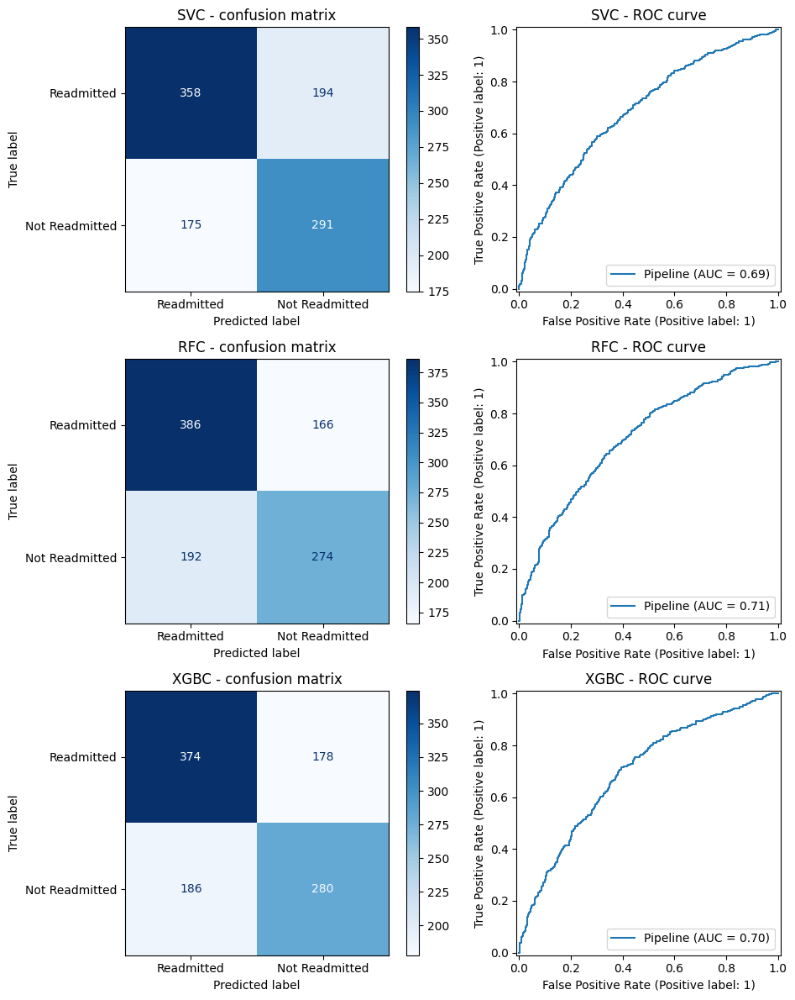

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay
import matplotlib.pyplot as plt

def plot_evaluation_graphs(models: list[tuple[str, Pipeline]]):
    fig, ax = plt.subplots(len(models), 2, figsize=(10, 4 * len(models)))

    for i, model in enumerate(models):
        # Confusion Matrix
        ax[i][0].set_title(f"{model[0]} - confusion matrix")
        ConfusionMatrixDisplay.from_estimator(model[1], X_test, y_test, display_labels=["Readmitted", "Not Readmitted"], ax=ax[i][0], cmap="Blues")

        # ROC Curve
        ax[i][1].set_title(f"{model[0]} - ROC curve")
        RocCurveDisplay.from_estimator(model[1], X_test, y_test, ax=ax[i][1])

    fig.tight_layout()
    plt.show()

models = [
    ("SVC", best_svc_model),
    ("RFC", best_rf_model),
    ("XGBC", best_xgb_model),
]
plot_evaluation_graphs(models)

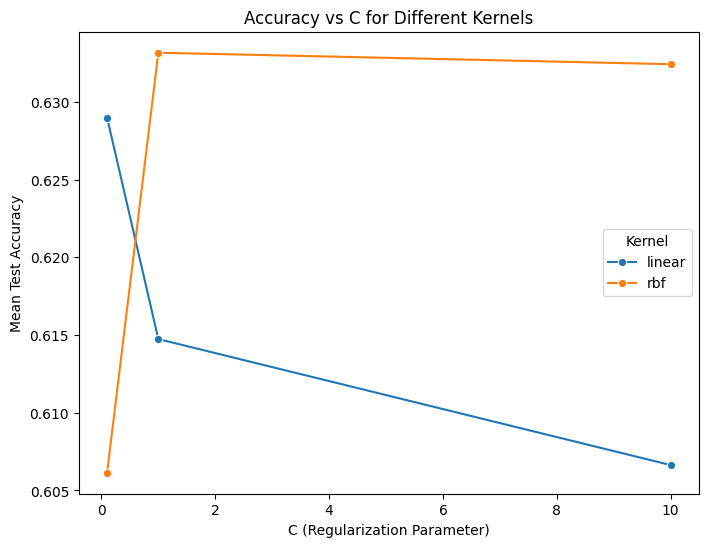

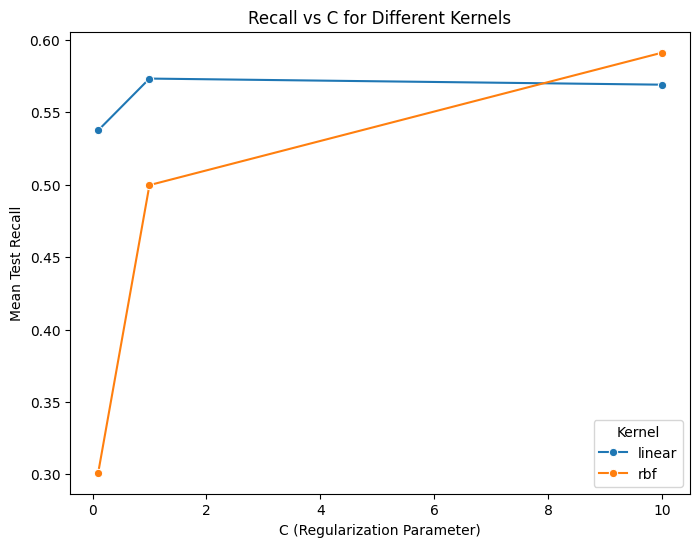

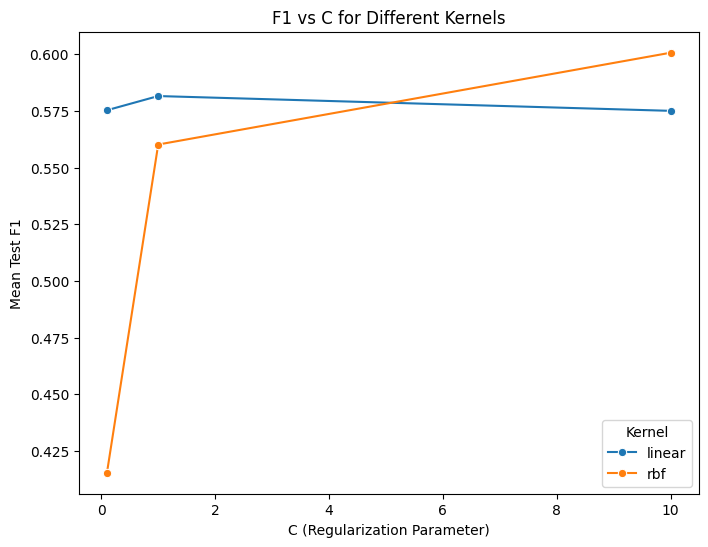

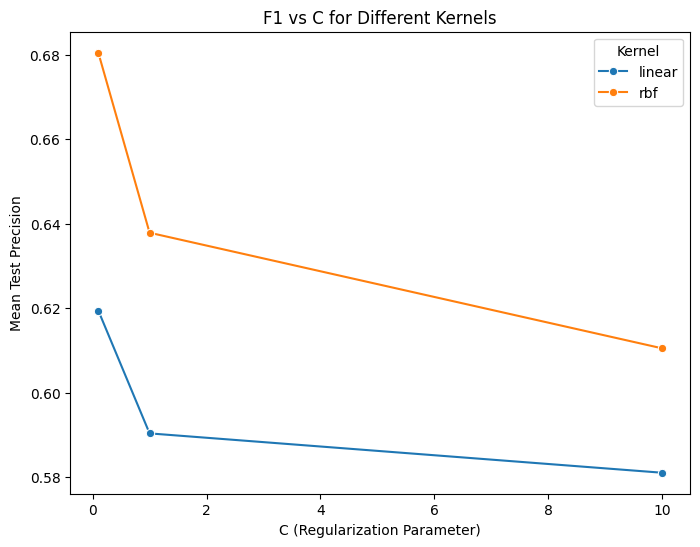

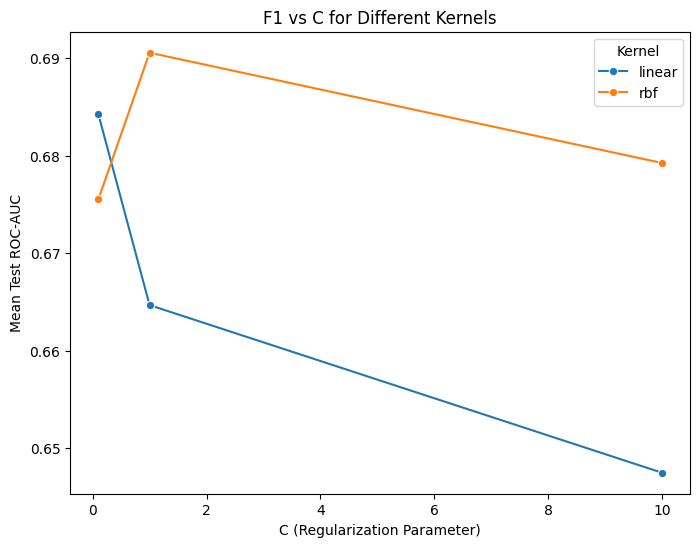

In [ ]:
# Task 3.4
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Get the results from GridSearchCV
results = tuned_accuracy_svc.cv_results_

# Convert the results to a DataFrame for easier manipulation
results_df = pd.DataFrame(results)

# How the accuracy changes as a function of the 'C' hyperparameter for each kernel type

# Plotting for accuracy
plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__C', y='mean_test_accuracy', hue='param_regressor__kernel', marker='o')
plt.title('Accuracy vs C for Different Kernels')
plt.xlabel('C (Regularization Parameter)')
plt.ylabel('Mean Test Accuracy')
plt.legend(title='Kernel')
plt.show()


# Plotting for recall
plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__C', y='mean_test_recall', hue='param_regressor__kernel', marker='o')
plt.title('Recall vs C for Different Kernels')
plt.xlabel('C (Regularization Parameter)')
plt.ylabel('Mean Test Recall')
plt.legend(title='Kernel')
plt.show()


# Plotting for f1
plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__C', y='mean_test_f1', hue='param_regressor__kernel', marker='o')
plt.title('F1 vs C for Different Kernels')
plt.xlabel('C (Regularization Parameter)')
plt.ylabel('Mean Test F1')
plt.legend(title='Kernel')
plt.show()

# Plotting for precision
plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__C', y='mean_test_precision', hue='param_regressor__kernel', marker='o')
plt.title('F1 vs C for Different Kernels')
plt.xlabel('C (Regularization Parameter)')
plt.ylabel('Mean Test Precision')
plt.legend(title='Kernel')
plt.show()

# Plotting for AUC
plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__C', y='mean_test_roc_auc', hue='param_regressor__kernel', marker='o')
plt.title('F1 vs C for Different Kernels')
plt.xlabel('C (Regularization Parameter)')
plt.ylabel('Mean Test ROC-AUC')
plt.legend(title='Kernel')
plt.show()

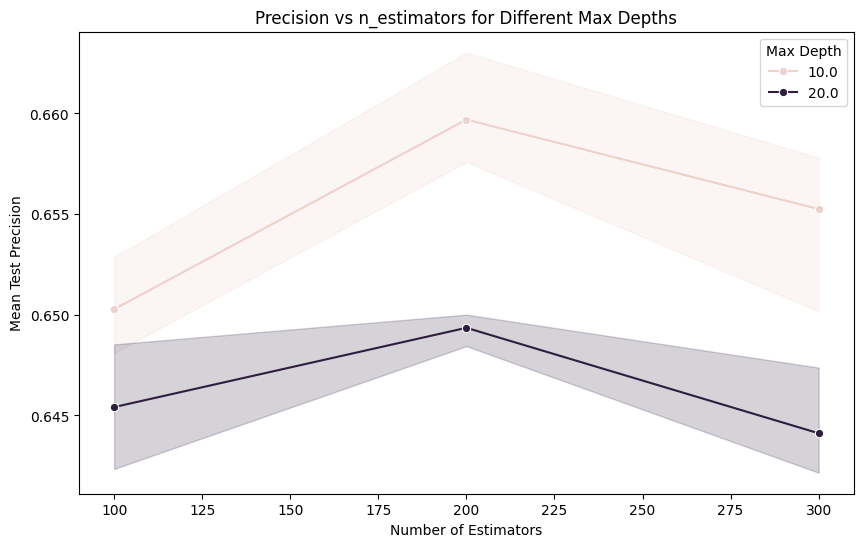

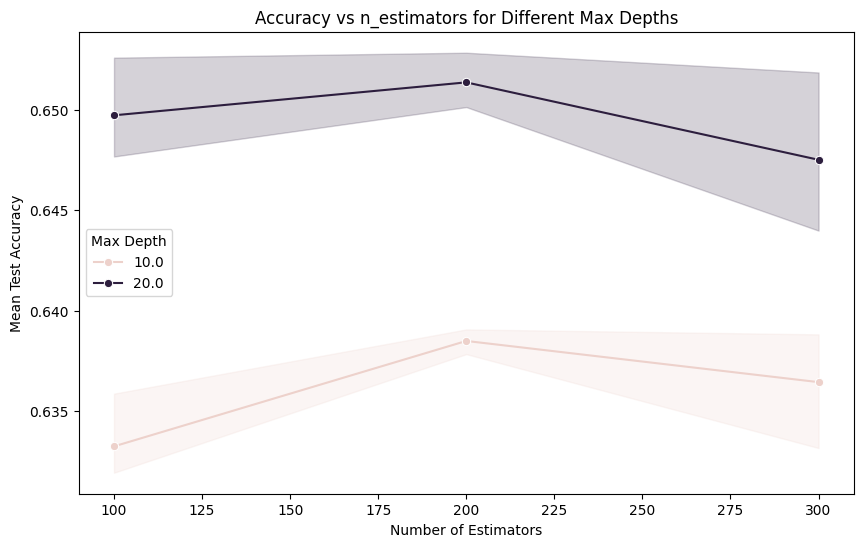

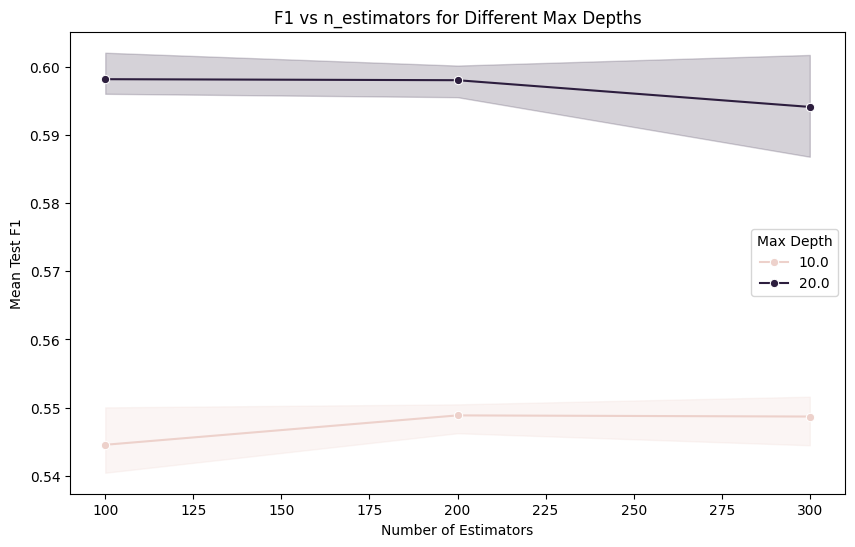

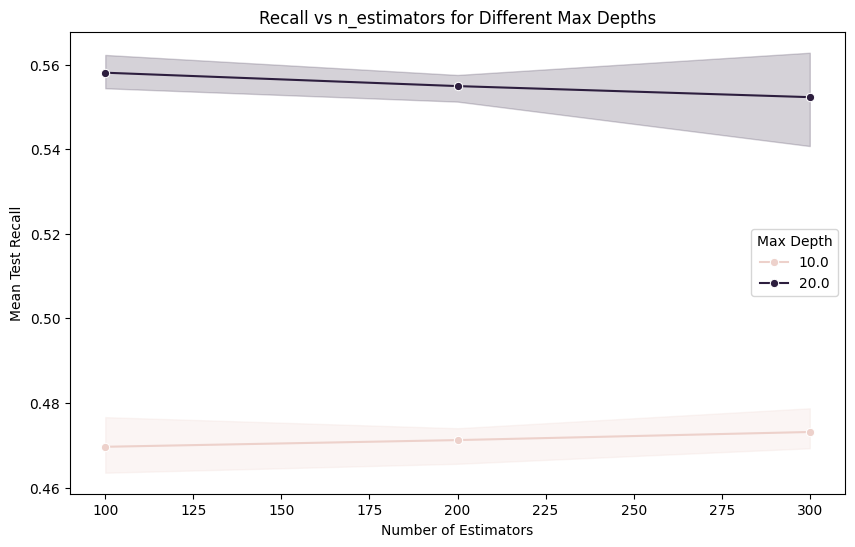

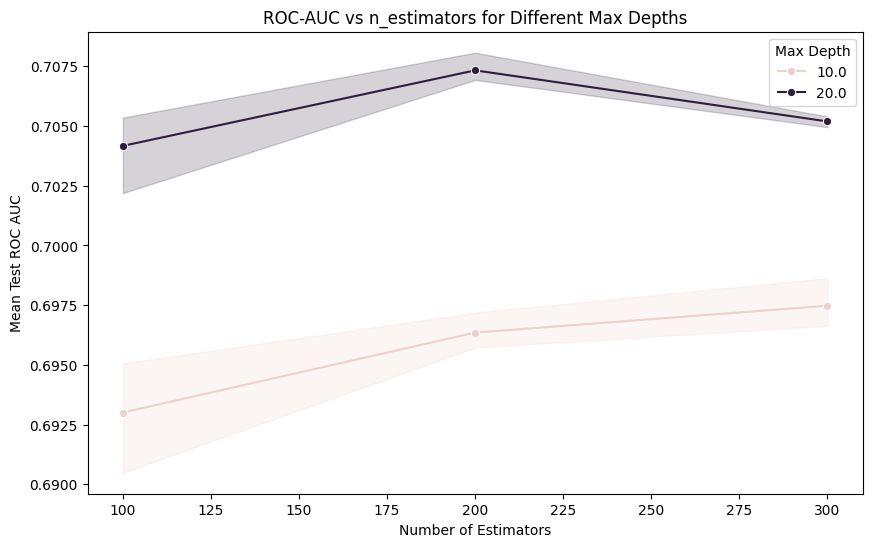

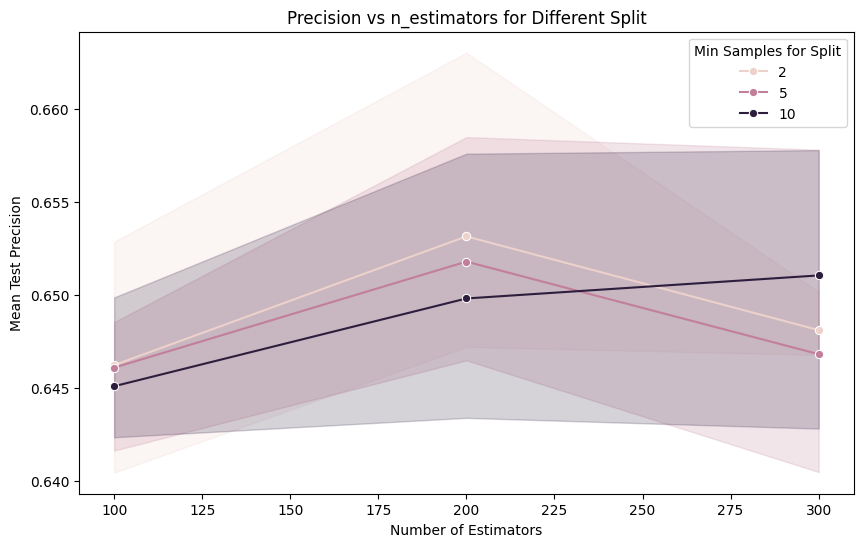

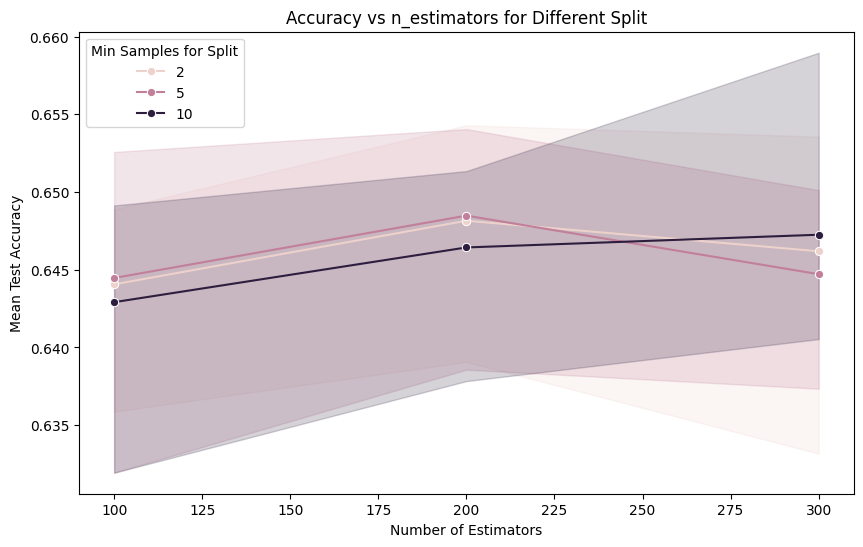

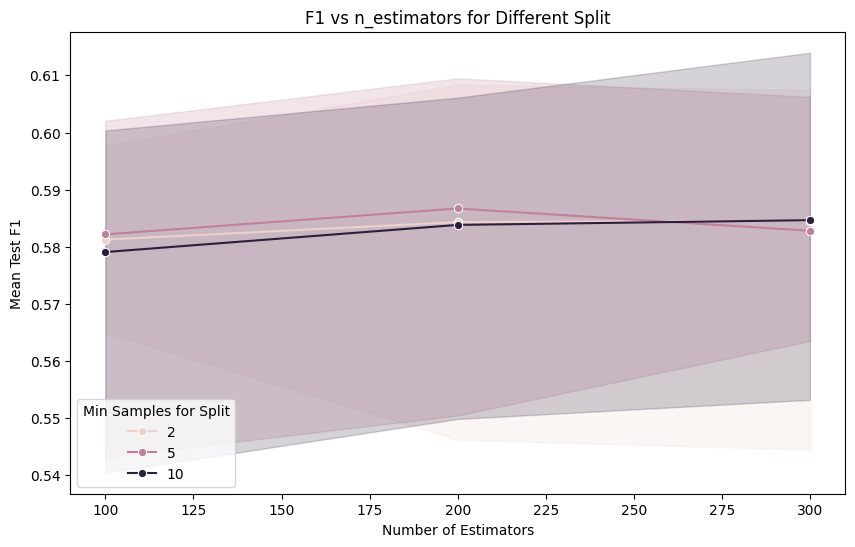

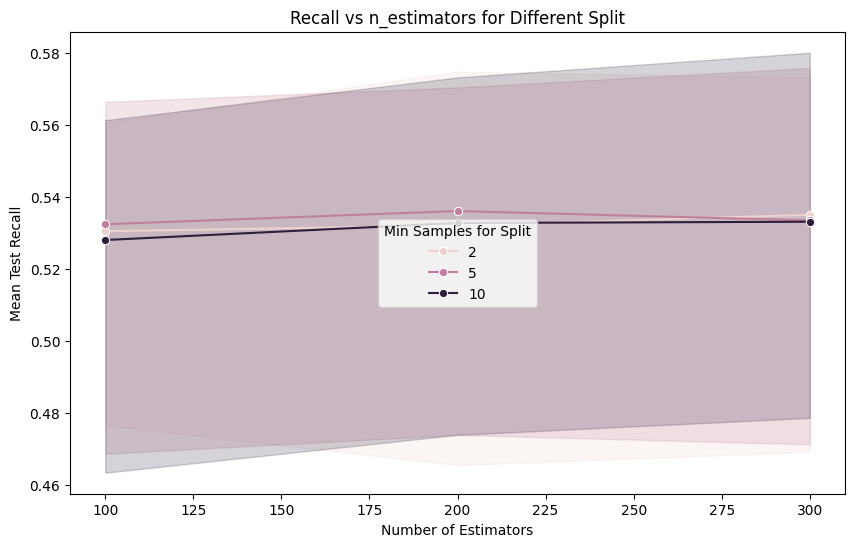

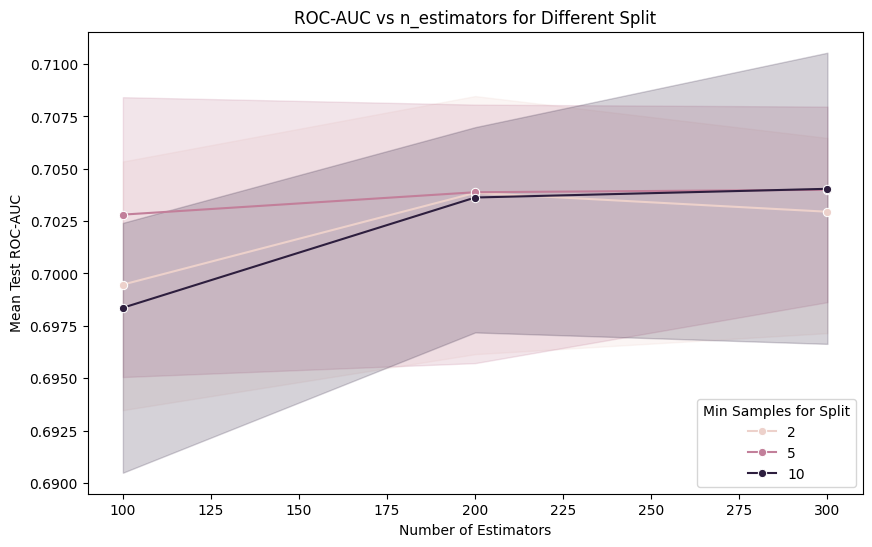

In [ ]:
# Task 3.4 tuned_rf_clf
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Get the results from GridSearchCV
results = tuned_rf_clf.cv_results_

# Convert the results to a DataFrame for easier manipulation
results_rf_df = pd.DataFrame(results)

## Plotting precision vs n_estimators
plt.figure(figsize=(10, 6))
sns.lineplot(data=results_rf_df, x='param_regressor__n_estimators', y='mean_test_precision', hue='param_regressor__max_depth', marker='o')
plt.title('Precision vs n_estimators for Different Max Depths')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Test Precision')
plt.legend(title='Max Depth')
plt.show()

## Plotting accuracy vs n_estimators
plt.figure(figsize=(10, 6))
sns.lineplot(data=results_rf_df, x='param_regressor__n_estimators', y='mean_test_accuracy', hue='param_regressor__max_depth', marker='o')
plt.title('Accuracy vs n_estimators for Different Max Depths')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Test Accuracy')
plt.legend(title='Max Depth')
plt.show()

## Plotting accuracy vs n_estimators
plt.figure(figsize=(10, 6))
sns.lineplot(data=results_rf_df, x='param_regressor__n_estimators', y='mean_test_f1', hue='param_regressor__max_depth', marker='o')
plt.title('F1 vs n_estimators for Different Max Depths')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Test F1')
plt.legend(title='Max Depth')
plt.show()

## Plotting accuracy vs n_estimators
plt.figure(figsize=(10, 6))
sns.lineplot(data=results_rf_df, x='param_regressor__n_estimators', y='mean_test_recall', hue='param_regressor__max_depth', marker='o')
plt.title('Recall vs n_estimators for Different Max Depths')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Test Recall')
plt.legend(title='Max Depth')
plt.show()

## Plotting accuracy vs n_estimators
plt.figure(figsize=(10, 6))
sns.lineplot(data=results_rf_df, x='param_regressor__n_estimators', y='mean_test_roc_auc', hue='param_regressor__max_depth', marker='o')
plt.title('ROC-AUC vs n_estimators for Different Max Depths')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Test ROC AUC')
plt.legend(title='Max Depth')
plt.show()


## Plotting precision vs n_estimators for different min_splits
plt.figure(figsize=(10, 6))
sns.lineplot(data=results_rf_df, x='param_regressor__n_estimators', y='mean_test_precision', hue='param_regressor__min_samples_split', marker='o')
plt.title('Precision vs n_estimators for Different Split')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Test Precision')
plt.legend(title='Min Samples for Split')
plt.show()

## Plotting Accuracy vs n_estimators for different min_splits
plt.figure(figsize=(10, 6))
sns.lineplot(data=results_rf_df, x='param_regressor__n_estimators', y='mean_test_accuracy', hue='param_regressor__min_samples_split', marker='o')
plt.title('Accuracy vs n_estimators for Different Split')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Test Accuracy')
plt.legend(title='Min Samples for Split')
plt.show()

## Plotting F1 vs n_estimators for different min_splits
plt.figure(figsize=(10, 6))
sns.lineplot(data=results_rf_df, x='param_regressor__n_estimators', y='mean_test_f1', hue='param_regressor__min_samples_split', marker='o')
plt.title('F1 vs n_estimators for Different Split')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Test F1')
plt.legend(title='Min Samples for Split')
plt.show()

## Plotting Recall vs n_estimators for different min_splits
plt.figure(figsize=(10, 6))
sns.lineplot(data=results_rf_df, x='param_regressor__n_estimators', y='mean_test_recall', hue='param_regressor__min_samples_split', marker='o')
plt.title('Recall vs n_estimators for Different Split')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Test Recall')
plt.legend(title='Min Samples for Split')
plt.show()

## Plotting ROC-AUC vs n_estimators for different min_splits
plt.figure(figsize=(10, 6))
sns.lineplot(data=results_rf_df, x='param_regressor__n_estimators', y='mean_test_roc_auc', hue='param_regressor__min_samples_split', marker='o')
plt.title('ROC-AUC vs n_estimators for Different Split')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Test ROC-AUC')
plt.legend(title='Min Samples for Split')
plt.show()

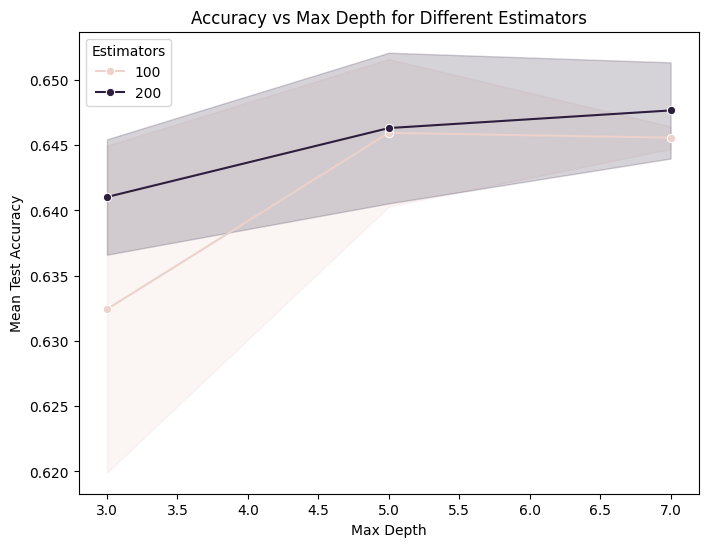

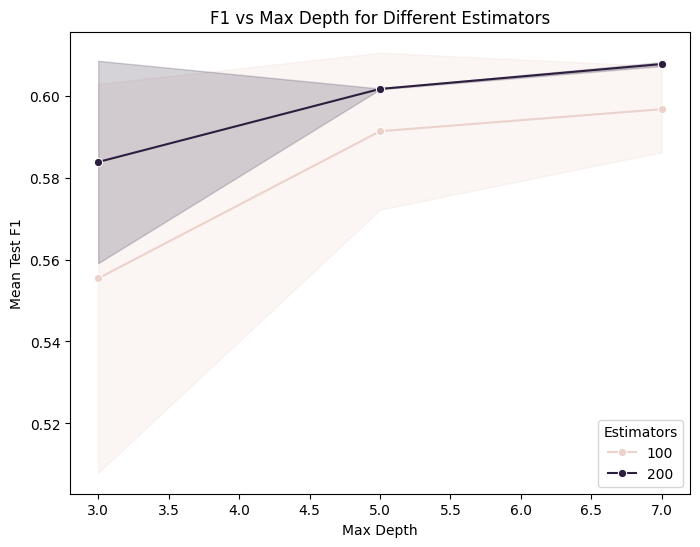

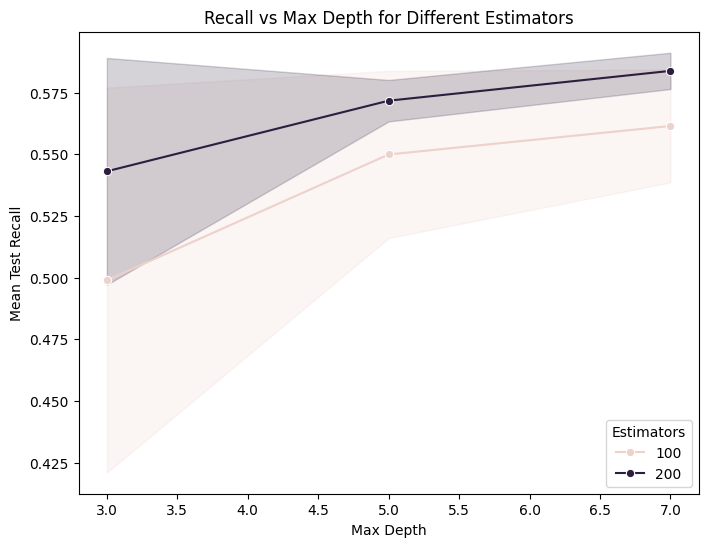

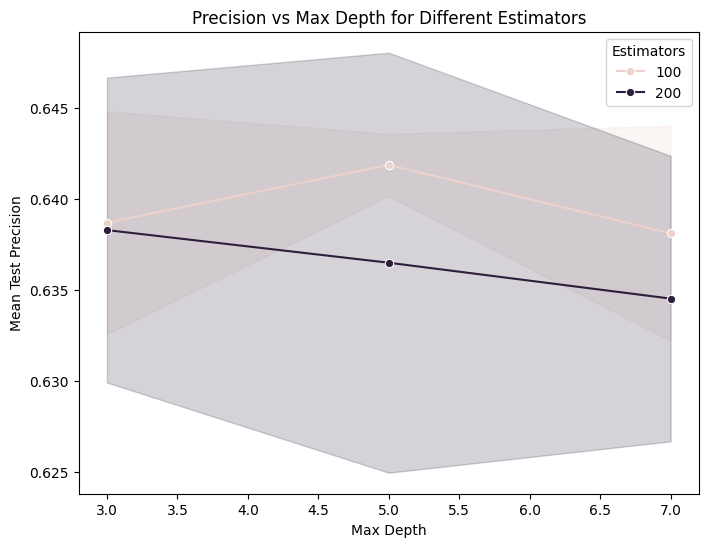

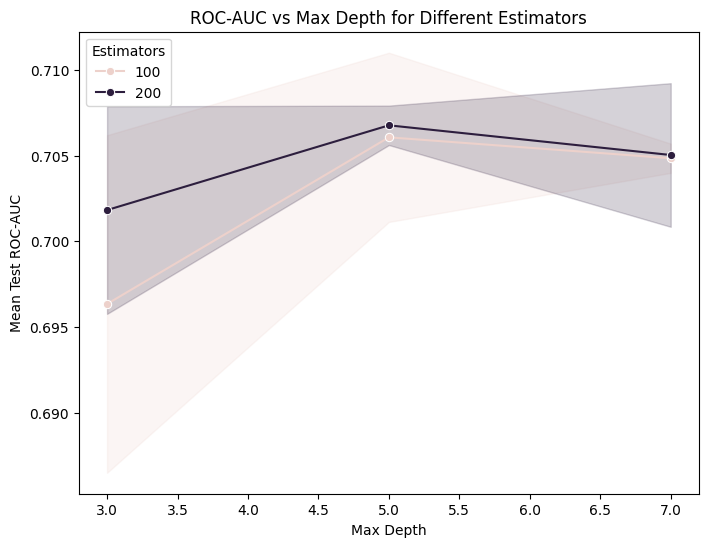

...

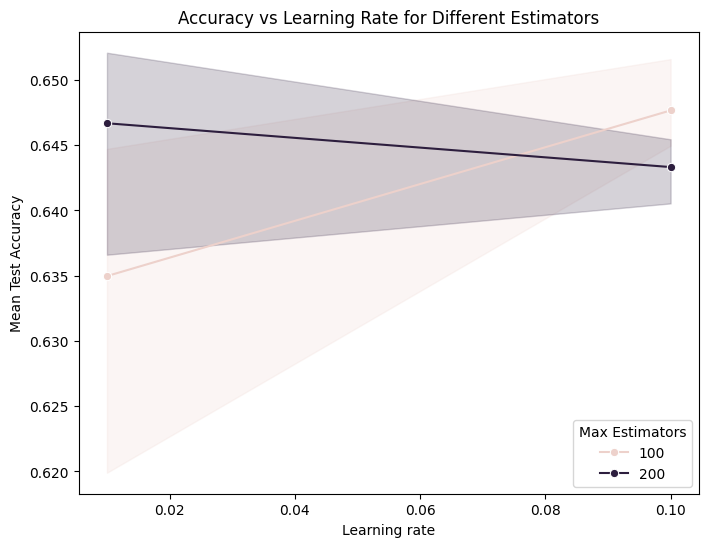

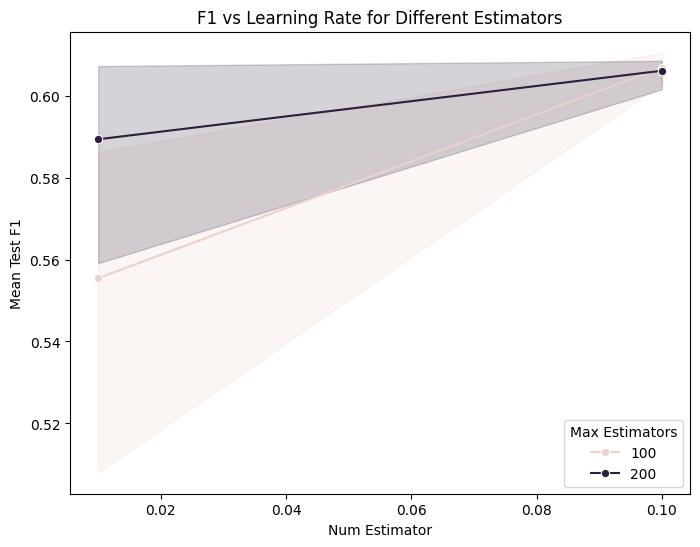

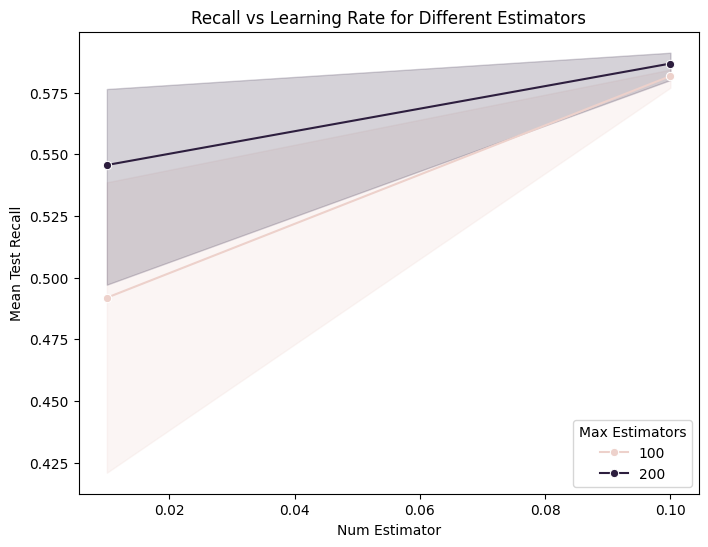

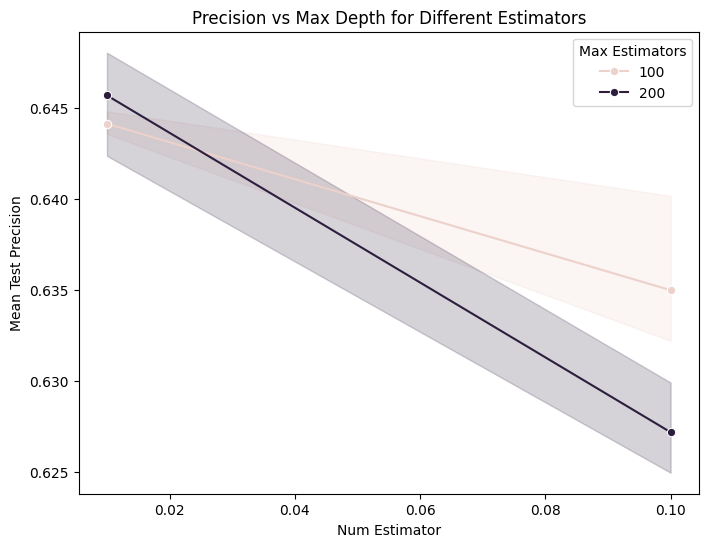

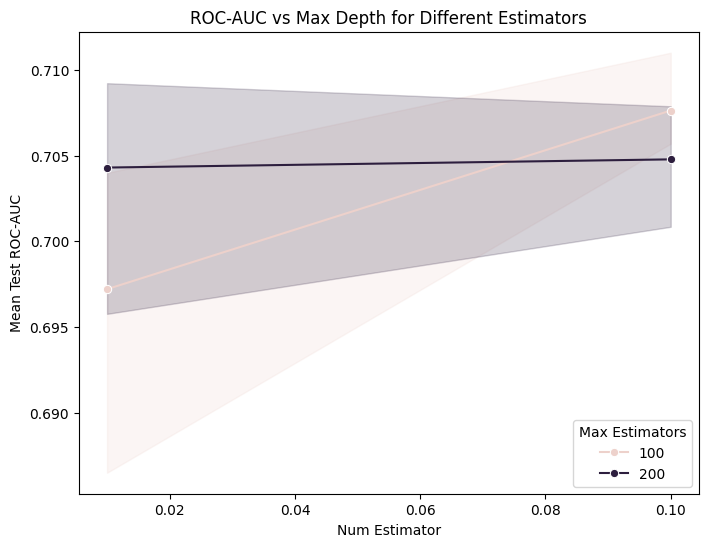

In [ ]:
# Task 3.4 tuned_xgb_clf
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Get the results from GridSearchCV
results = tuned_xgb_clf.cv_results_

# Convert the results to a DataFrame for easier manipulation
results_df = pd.DataFrame(results)


# Metrics vs max_depth
plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__max_depth', y='mean_test_accuracy', hue='param_regressor__n_estimators', marker='o')
plt.title('Accuracy vs Max Depth for Different Estimators')
plt.xlabel('Max Depth')
plt.ylabel('Mean Test Accuracy')
plt.legend(title='Estimators')
plt.show()

plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__max_depth', y='mean_test_f1', hue='param_regressor__n_estimators', marker='o')
plt.title('F1 vs Max Depth for Different Estimators')
plt.xlabel('Max Depth')
plt.ylabel('Mean Test F1')
plt.legend(title='Estimators')
plt.show()


plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__max_depth', y='mean_test_recall', hue='param_regressor__n_estimators', marker='o')
plt.title('Recall vs Max Depth for Different Estimators')
plt.xlabel('Max Depth')
plt.ylabel('Mean Test Recall')
plt.legend(title='Estimators')
plt.show()

plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__max_depth', y='mean_test_precision', hue='param_regressor__n_estimators', marker='o')
plt.title('Precision vs Max Depth for Different Estimators')
plt.xlabel('Max Depth')
plt.ylabel('Mean Test Precision')
plt.legend(title='Estimators')
plt.show()

plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__max_depth', y='mean_test_roc_auc', hue='param_regressor__n_estimators', marker='o')
plt.title('ROC-AUC vs Max Depth for Different Estimators')
plt.xlabel('Max Depth')
plt.ylabel('Mean Test ROC-AUC')
plt.legend(title='Estimators')
plt.show()


# Metrics vs n_estimator
plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__n_estimators', y='mean_test_accuracy', hue='param_regressor__max_depth', marker='o')
plt.title('Accuracy vs Num Estimator for Different Max Depth')
plt.xlabel('Num Estimator')
plt.ylabel('Mean Test Accuracy')
plt.legend(title='Max Depth')
plt.show()

plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__n_estimators', y='mean_test_f1', hue='param_regressor__max_depth', marker='o')
plt.title('F1 vs Num Estimator for Different Max Depth')
plt.xlabel('Num Estimator')
plt.ylabel('Mean Test F1')
plt.legend(title='Max Depth')
plt.show()


plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__n_estimators', y='mean_test_recall', hue='param_regressor__max_depth', marker='o')
plt.title('Recall vs Num Estimator for Different Max Depth')
plt.xlabel('Num Estimator')
plt.ylabel('Mean Test Recall')
plt.legend(title='Max Depth')
plt.show()

plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__n_estimators', y='mean_test_precision', hue='param_regressor__max_depth', marker='o')
plt.title('Precision vs Num Estimator for Different Max Depth')
plt.xlabel('Num Estimator')
plt.ylabel('Mean Test Precision')
plt.legend(title='Max Depth')
plt.show()

plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__n_estimators', y='mean_test_roc_auc', hue='param_regressor__max_depth', marker='o')
plt.title('ROC-AUC vs Num Estimator for Different Max Depth')
plt.xlabel('Num Estimator')
plt.ylabel('Mean Test ROC-AUC')
plt.legend(title='Max Depth')
plt.show()



# Metrics vs learning_rate
plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__learning_rate', y='mean_test_accuracy', hue='param_regressor__n_estimators', marker='o')
plt.title('Accuracy vs Learning Rate for Different Estimators')
plt.xlabel('Learning rate')
plt.ylabel('Mean Test Accuracy')
plt.legend(title='Max Estimators')
plt.show()

plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__learning_rate', y='mean_test_f1', hue='param_regressor__n_estimators', marker='o')
plt.title('F1 vs Learning Rate for Different Estimators')
plt.xlabel('Num Estimator')
plt.ylabel('Mean Test F1')
plt.legend(title='Max Estimators')
plt.show()


plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__learning_rate', y='mean_test_recall', hue='param_regressor__n_estimators', marker='o')
plt.title('Recall vs Learning Rate for Different Estimators')
plt.xlabel('Num Estimator')
plt.ylabel('Mean Test Recall')
plt.legend(title='Max Estimators')
plt.show()

plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__learning_rate', y='mean_test_precision', hue='param_regressor__n_estimators', marker='o')
plt.title('Precision vs Max Depth for Different Estimators')
plt.xlabel('Num Estimator')
plt.ylabel('Mean Test Precision')
plt.legend(title='Max Estimators')
plt.show()

plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_regressor__learning_rate', y='mean_test_roc_auc', hue='param_regressor__n_estimators', marker='o')
plt.title('ROC-AUC vs Max Depth for Different Estimators')
plt.xlabel('Num Estimator')
plt.ylabel('Mean Test ROC-AUC')
plt.legend(title='Max Estimators')
plt.show()


---

In [ ]:
# 3.5 Create a table to show mean cross-validation and test performance with their respective std

from sklearn.metrics import mean_squared_error as root_mean_squared_error
from sklearn.metrics import recall_score

def evaluate_performance(model_name: str, tuner: GridSearchCV, results_df: pd.DataFrame):
    cv_test_scores = tuner.cv_results_["mean_test_recall"]
    cv_score_mean = cv_test_scores.mean()
    cv_score_std = cv_test_scores.std()

    y_pred = tuner.predict(X_test)
    test_score = recall_score(y_pred, y_test)

    results_df.loc[len(results_df)] = [model_name, tuner.best_params_, -cv_score_mean, cv_score_std, test_score]

In [ ]:
results_df = pd.DataFrame(columns=['Model', 'Best Parameters', 'Mean CV Score', "CV score std", 'Test score'])
evaluate_performance("SVM", tuned_accuracy_svc, results_df)
evaluate_performance("RFC", tuned_rf_clf, results_df)
evaluate_performance("XGBoost", tuned_xgb_clf, results_df)
results_df

,Model,Best Parameters,Mean CV Score,CV score std,Test score
0,SVM,"{'regressor__C': 10, 'regressor__kernel': 'rbf'}",-0.512018,0.098793,0.600000
1,RFC,"{'regressor__max_depth': None, 'regressor__min...",-0.532711,0.044305,0.622727
2,XGBoost,"{'regressor__learning_rate': 0.1, 'regressor__...",-0.551520,0.048960,0.611354


---

### Task 4

4.1 Model Coefficient

* SVM

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

# Compute permutation importance for each model
result_svc = permutation_importance(tuned_accuracy_svc.best_estimator_, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)



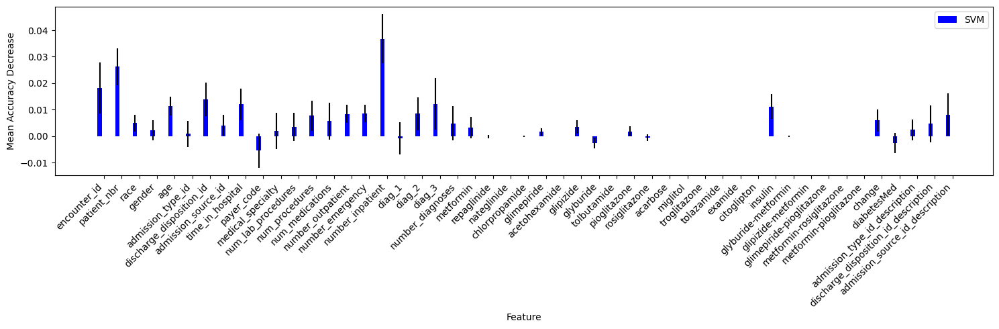

In [ ]:
# Extract feature names
feature_names = X_test.columns if hasattr(X_test, 'columns') else [f"Feature {i}" for i in range(X_test.shape[1])]


fig, ax = plt.subplots(figsize=(15, 5))

# SVM
ax.bar(np.arange(len(feature_names)) + 0.25, result_svc.importances_mean, yerr=result_svc.importances_std, width=0.25, label="SVM", color='blue')


# Set x-ticks and labels
ax.set_xticks(np.arange(len(feature_names)) + 0.5)
ax.set_xticklabels(feature_names, rotation=45, ha="right")
ax.set_ylabel("Mean Accuracy Decrease")
ax.set_xlabel("Feature")
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()

4.1-b Feature importance
* RandomForest
* XGBoost

In [ ]:
# RF
import matplotlib.pyplot as plt

rf_model = tuned_rf_clf.best_estimator_.named_steps['regressor']
importances_rf = rf_model.feature_importances_
feature_names = tuned_rf_clf.best_estimator_.named_steps['preprocessor'].get_feature_names_out()

# Combine the importances with the feature names
feature_importances = pd.Series(importances_rf, index=feature_names)

# Sort the features by importance in descending order and select top 10
top_10_features = feature_importances.nlargest(25)

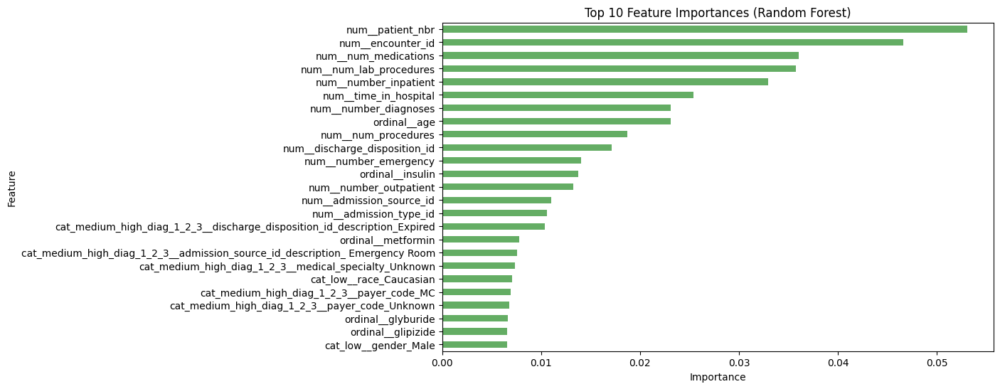

In [ ]:
# Plot the top 10 features
plt.figure(figsize=(10, 6))
top_10_features.sort_values().plot.barh(color="forestgreen", alpha=0.7)
plt.title("Top 10 Feature Importances (Random Forest)")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()

In [ ]:
# XGBoost
import matplotlib.pyplot as plt

xgb_model = tuned_xgb_clf.best_estimator_.named_steps['regressor']
importances_rf = xgb_model.feature_importances_
feature_names = tuned_xgb_clf.best_estimator_.named_steps['preprocessor'].get_feature_names_out()

# Combine the importances with the feature names
feature_importances = pd.Series(importances_rf, index=feature_names)

# Sort the features by importance in descending order and select top 10
top_10_features = feature_importances.nlargest(25)

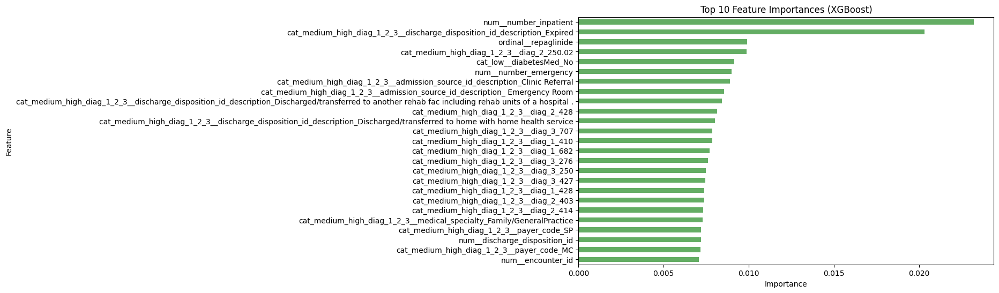

In [ ]:
# Plot the top 10 features
plt.figure(figsize=(10, 6))
top_10_features.sort_values().plot.barh(color="forestgreen", alpha=0.7)
plt.title("Top 10 Feature Importances (XGBoost)")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()

---

#### Task 5

In [ ]:
# 5.1 - Include feature selection within the cross-validation pipeline
# implemented in Task 3 and try feature selection strategies (select k best and recursive feature elimination)
# with the best model


---

Load the model

In [ ]:
# Load the model
loaded_rf_model = joblib.load('best_rf_model.pkl')

In [ ]:
print(X_train.shape)
print(y_train.shape)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, balanced_accuracy_score
from sklearn.pipeline import Pipeline

def get_metrics(name: str, model: Pipeline, use_proba: bool = False):
    # Predictions
    y_pred_test = model.predict(X_test)

    # Probabilities for AUC computation
    y_proba_test = model.predict_proba(X_test)[:, 1] if use_proba else model.decision_function(X_test)

    # Compute classification metrics
    metrics_test = {
        "Model": name,
        "Accuracy": balanced_accuracy_score(y_test, y_pred_test),
        "Precision": precision_score(y_test, y_pred_test),
        "Recall": recall_score(y_test, y_pred_test),
        "F1-score": f1_score(y_test, y_pred_test),
        "AUC": roc_auc_score(y_test, y_proba_test),
    }

    return metrics_test

---

In [ ]:
# 1. Select KBest with XGBoost
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier

def make_feature_selection_pipeline(feature_selection_step, scoring: str):
    rf_params = {'randomforestclassifier__n_estimators': [100, 200, 300], 'randomforestclassifier__max_depth': [None, 10, 20], 'randomforestclassifier__min_samples_split': [2, 5, 10]}

    model_rf_select = make_pipeline(
        preprocessor,
        feature_selection_step,
        RandomForestClassifier(random_state=42)
    )

    return GridSearchCV(
        estimator=model_rf_select,
        cv=3,
        param_grid=rf_params,
        n_jobs=-1,
        error_score=0,
        refit='recall',
        scoring='recall', # scoring=scoring
        verbose=1
    )


# Example using SelectKBest for feature selection
kbest_pipeline = make_feature_selection_pipeline(
    SelectKBest(score_func=f_classif, k=10), 'recall') #['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
# )

# Fit GridSearchCV with the SelectKBest feature selection and hyperparameter tuning
kbest_result = kbest_pipeline.fit(X_train, y_train)


Fitting 3 folds for each of 27 candidates, totalling 81 fits


/usr/local/lib/python3.11/dist-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [1152 1155 1159 1160 1162 1163 1166 1167 1168 1169] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


In [ ]:
from sklearn.metrics import mean_squared_error as root_mean_squared_error
from sklearn.metrics import recall_score

def evaluate_performance(model_name: str, tuner: GridSearchCV, results_df: pd.DataFrame):
    cv_test_scores = tuner.cv_results_["mean_test_score"]
    cv_score_mean = cv_test_scores.mean()
    cv_score_std = cv_test_scores.std()

    y_pred = tuner.predict(X_test)
    test_score = recall_score(y_pred, y_test)

    results_df.loc[len(results_df)] = [model_name, tuner.best_params_, -cv_score_mean, cv_score_std, test_score]

In [ ]:
# 5.2
results_df = pd.DataFrame(columns=['Model', 'Best Parameters', 'Mean CV Score', "CV score std", 'Test score'])
evaluate_performance("RFC", kbest_pipeline, results_df)
results_df

,Model,Best Parameters,Mean CV Score,CV score std,Test score
0,RFC,"{'randomforestclassifier__max_depth': 20, 'ran...",-0.54322,0.006897,0.558952


---